In [1]:
from pathlib import Path
from typing  import Dict, Optional, Sequence, Tuple, Callable
from tqdm    import tqdm
from io      import StringIO

from adaptive.utils      import cwd
from adaptive.estimators import gamma_prior
from adaptive.smoothing  import notched_smoothing

from etl import *
from rtlive_old_model import run_rtlive_old_model
from luis_model import run_luis_model

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import subprocess

# PARAMETERS
CI               = 0.95
smoothing_window = 7
rexepath         = 'C:\\Program Files\\R\\R-3.6.1\\bin\\'

# Folder structures and file names
root     = Path("C:\\Users\\steve\\OneDrive\\Current Documents\\Research\\COVID\\adaptive-lockdown\\studies\\us_states_validation")
data     = root/"data"
plots    = root/"plots"
if not data.exists():
    data.mkdir()
if not plots.exists():
    plots.mkdir()

Using cuDNN version 7005 on context None
Mapped name None to device cuda: GeForce MX150 (0000:01:00.0)


In [4]:
from us_states_rt_est import *

df = import_clean_smooth_cases_metro(data, notched_smoothing(window=smoothing_window))

# run_adaptive_model(df=df, locationvar='cbsa_fips_state', CI=CI, filepath=data)
# run_luis_model(df=df, locationvar='cbsa_fips_state', CI=CI, filepath=data)
run_rtlive_old_model(df=df, locationvar='cbsa_fips_state', CI=CI, filepath=data)


Working on 10420_OH


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


MethodNotDefined: ('perform', <class 'theano.gpuarray.elemwise.GpuElemwise'>, 'GpuElemwise', 'Did you used Theano flags mode=FAST_COMPILE? You can use optimizer=fast_compile instead.')
Apply node that caused the error: GpuElemwise{exp,no_inplace}(GpuReshape{0}.0)
Toposort index: 3
Inputs types: [GpuArrayType<None>(float32, scalar)]
Inputs shapes: [()]
Inputs strides: [()]
Inputs values: [gpuarray.array(-2.5283766, dtype=float32)]
Inputs type_num: [11]
Outputs clients: [[InplaceGpuDimShuffle{x}(GpuElemwise{exp,no_inplace}.0), GpuElemwise{pow,no_inplace}(GpuElemwise{exp,no_inplace}.0, GpuArrayConstant{2.0}), GpuElemwise{ge,no_inplace}(GpuElemwise{exp,no_inplace}.0, GpuArrayConstant{0}), GpuElemwise{mul}[]<gpuarray>(InplaceGpuDimShuffle{}.0, GpuElemwise{exp,no_inplace}.0), GpuElemwise{pow}[]<gpuarray>(GpuElemwise{exp,no_inplace}.0, GpuArrayConstant{1.0}), GpuElemwise{mul}[]<gpuarray>(GpuElemwise{add,no_inplace}.0, GpuElemwise{exp,no_inplace}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "<ipython-input-4-6366808e317b>", line 7, in <module>
    run_rtlive_old_model(df=df, locationvar='cbsa_fips_state', CI=CI, filepath=data)
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 38, in run_rtlive_old_model
    models[loc] = create_and_run_model(loc, loc_df, p_delay)
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 264, in create_and_run_model
    return MCMCModel(name, onset, cumulative_p_delay).run()
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 228, in run
    step_size = pm.HalfNormal('step_size', sigma=.1)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\distributions\distribution.py", line 83, in __new__
    return model.Var(name, dist, data, total_size, dims=dims)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\model.py", line 1082, in Var
    model=self,
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\model.py", line 1930, in __init__
    normalRV = transform.backward(self.transformed)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\distributions\transforms.py", line 207, in backward
    return tt.exp(x)
  File "<ipython-input-4-6366808e317b>", line 7, in <module>
    run_rtlive_old_model(df=df, locationvar='cbsa_fips_state', CI=CI, filepath=data)
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 38, in run_rtlive_old_model
    models[loc] = create_and_run_model(loc, loc_df, p_delay)
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 264, in create_and_run_model
    return MCMCModel(name, onset, cumulative_p_delay).run()
  File "C:\Users\steve\OneDrive\Current Documents\Research\COVID\adaptive-lockdown\studies\us_states_validation\rtlive_old_model.py", line 228, in run
    step_size = pm.HalfNormal('step_size', sigma=.1)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\distributions\distribution.py", line 83, in __new__
    return model.Var(name, dist, data, total_size, dims=dims)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\model.py", line 1082, in Var
    model=self,
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\model.py", line 1930, in __init__
    normalRV = transform.backward(self.transformed)
  File "C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\pymc3\distributions\transforms.py", line 207, in backward
    return tt.exp(x)

Debugprint of the apply node: 
GpuElemwise{exp,no_inplace} [id A] <GpuArrayType<None>(float32, scalar)> ''   
 |GpuReshape{0} [id B] <GpuArrayType<None>(float32, scalar)> ''   
   |GpuSubtensor{int64:int64:} [id C] <GpuArrayType<None>(float32, vector)> ''   
   | |GpuFromHost<None> [id D] <GpuArrayType<None>(float32, vector)> ''   
   | | |__args_joined [id E] <TensorType(float32, vector)>
   | |Constant{100} [id F] <int64>
   | |Constant{101} [id G] <int64>
   |TensorConstant{[]} [id H] <TensorType(float32, vector)>

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

In [7]:
from pathlib import Path
from typing  import Dict, Optional, Sequence, Tuple, Callable
from tqdm    import tqdm
from io      import StringIO

from adaptive.utils      import cwd
from adaptive.estimators import gamma_prior
from adaptive.smoothing  import notched_smoothing

from etl import import_clean_smooth_cases, get_new_rt_live_estimates
from rtlive_old_model import run_rtlive_old_model
from luis_model import run_luis_model

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import subprocess

CI               = 0.95
smoothing_window = 7

# Folder structures and file names
root     = Path("C:\\Users\\steve\\OneDrive\\Current Documents\\Research\\COVID\\adaptive-lockdown\\studies\\us_states_validation")
data     = root/"data"
plots    = root/"plots"
if not data.exists():
    data.mkdir()
if not plots.exists():
    plots.mkdir()

# Get data case data
df = import_clean_smooth_cases(data, notched_smoothing(window=smoothing_window))

In [9]:
state      ='Illinois'
locationvar='state'
filepath   = data

In [10]:
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy.stats import poisson
from scipy.stats import nbinom
from numpy import log as ln
from typing import Callable
from datetime import datetime, timedelta
from pathlib import Path
from tqdm import tqdm

infperiod = 4.5 # length of infectious period, adjust as needed

# Loop through locs
locs = df[locationvar].unique()
returndf = pd.DataFrame()
print(f"Estimating Luis code Rt values for each {locationvar}...")
for loc in tqdm(locs):
    
    print(f"Working on {loc}...")

    from scipy.stats import gamma # not sure why this needs to be recalled after each loc, but otherwite get a type exception
    import numpy as np

    locdf     = df[df[locationvar]==loc].sort_values('date')
    confirmed = list(locdf['positive_smooth'])
    dates     = list(locdf['date'])

    # This skips the Rt analysis for locs for which there are <10 total cases
    if (confirmed[-1] < 10.):
        continue  

    # Calculate incidence (daily change)
    dconfirmed = np.diff(confirmed)
    for ii in range(len(dconfirmed)):
        if dconfirmed[ii] < 0. : dconfirmed[ii] = 0.
        if np.isnan(dconfirmed[ii]) : dconfirmed[ii] = 0.
    xd=dates[1:]

    # Smoothing over sdays (number of days) moving window, averages large chunking in reporting in consecutive days        
    yy = np.array(dconfirmed).ravel() 
    TotalCases = np.cumsum(yy) # These are confirmed cases after smoothing: tried also a lowess smoother but was a bit more parameer dependent from place to place.

    alpha=3. # shape parameter of gamma distribution
    beta=2.  # rate parameter of gamma distribution see https://en.wikipedia.org/wiki/Gamma_distribution

    valpha=[]
    vbeta=[]

    pred=[]
    pstdM=[]
    pstdm=[]
    NewCases=[]

    predR=[]
    pstRRM=[]
    pstRRm=[]

    anomalyday=[]
    anomalypred=[]

    for i in range(2,len(TotalCases)):
        new_cases=float(TotalCases[i]-TotalCases[i-1])
        old_new_cases=float(TotalCases[i-1]-TotalCases[i-2])

        # This uses a conjugate prior as a Gamma distribution for b_t, with parameters alpha and beta
        alpha =alpha+new_cases
        beta=beta +old_new_cases
        valpha.append(alpha)
        vbeta.append(beta)

        mean = gamma.stats(a=alpha, scale=1/beta, moments='m')

        RRest=1.+infperiod*ln(mean)
        if (RRest<0.): RRest=0.
        predR.append(RRest)
        testRRM=1.+infperiod*ln( gamma.ppf(CI, a=alpha, scale=1./beta) ) # these are the boundaries of the CI% confidence interval  for new cases
        if (testRRM <0.): testRRM=0.
        pstRRM.append(testRRM)
        testRRm=1.+infperiod*ln( gamma.ppf(1-CI, a=alpha, scale=1./beta) )
        if (testRRm <0.): testRRm=0.
        pstRRm.append(testRRm)

        if (new_cases==0. or old_new_cases==0.):
            pred.append(0.)
            pstdM.append(10.)
            pstdm.append(0.)
            NewCases.append(0.)

        if (new_cases>0. and old_new_cases>0.):
            NewCases.append(new_cases)

            # Using a Negative Binomial as the  Posterior Predictor of New Cases, given old one
            # This takes parameters r,p which are functions of new alpha, beta from Gamma
            r, p = alpha, beta/(old_new_cases+beta)
            mean, _, _, _ = nbinom.stats(r, p, moments='mvsk')

            pred.append(mean) # the expected value of new cases
            testciM=nbinom.ppf(CI, r, p) # these are the boundaries of the CI% confidence interval  for new cases
            testcim=nbinom.ppf(1-CI, r, p)
            
            if (testciM == 0) & (testcim == 0):
                testciM = 1
            
            pstdM.append(testciM)
            pstdm.append(testcim)

            np=p
            nr=r
            flag=0

            while (new_cases>testciM or new_cases<testcim):
                if (flag==0):
                    anomalypred.append(new_cases)
                    anomalyday.append(dates[i+1]) # the first new cases are at i=2

                # annealing: increase variance so as to encompass anomalous observation: allow Bayesian code to recover
                # mean of negbinomial=r*(1-p)/p  variance= r (1-p)/p**2
                # preserve mean, increase variance--> np=0.8*p (smaller), r= r (np/p)*( (1.-p)/(1.-np) )
                # test anomaly

                nnp=0.95*np # this doubles the variance, which tends to be small after many Bayesian steps
                nr= nr*(nnp/np)*( (1.-np)/(1.-nnp) ) # this assignement preserves the mean of expected cases
                np=nnp
                mean, var, skew, kurt = nbinom.stats(nr, np, moments='mvsk')
                testciM=nbinom.ppf(CI, nr, np)
                testcim=nbinom.ppf(1-CI, nr, np)
                
                print(f"\tMin-Max: {testcim} {testciM}")

                flag=1
            else:
                if (flag==1):
                    alpha=nr  # this updates the R distribution  with the new parameters that enclose the anomaly
                    beta=np/(1.-np)*old_new_cases

                    testciM=nbinom.ppf(CI, nr, np)
                    testcim=nbinom.ppf(1-CI, nr, np)

                    # annealing leaves the RR mean unchanged, but we need to adjus its widened CI:
                    testRRM=1.+infperiod*ln( gamma.ppf(CI, a=alpha, scale=1./beta) )# these are the boundaries of the CI% confidence interval  for new cases
                    if (testRRM <0.): testRRM=0.
                    testRRm=1.+infperiod*ln( gamma.ppf(1-CI, a=alpha, scale=1./beta) )
                    if (testRRm <0.): testRRm=0.

                    pstRRM=pstRRM[:-1] # remove last element and replace by expanded CI for RRest
                    pstRRm=pstRRm[:-1]
                    pstRRM.append(testRRM)
                    pstRRm.append(testRRm)

    # visualization of the time evolution of R_t with confidence intervals
    x=[]
    for i in range(len(predR)):
        x.append(i)
    days=dates[3:]
    xd=days
    dstr=[]
    for xdd in xd:
        dstr.append(xdd.strftime("%Y-%m-%d"))


    appenddf = pd.DataFrame({locationvar:loc,
                             'date':days,
                             'RR_pred_luis':predR,
                             'RR_CI_lower_luis':pstRRm,
                             'RR_CI_upper_luis':pstRRM})
    returndf = pd.concat([returndf,appenddf], axis=0) 


  0%|                                                                                           | 0/51 [00:00<?, ?it/s]

Estimating Luis code Rt values for each state...
Working on AK...


  2%|█▋                                                                                 | 1/51 [00:00<00:10,  4.58it/s]

	Min-Max: 60.0 90.0
	Min-Max: 60.0 90.0
	Min-Max: 59.0 91.0
	Min-Max: 59.0 91.0
	Min-Max: 59.0 92.0
	Min-Max: 58.0 92.0
	Min-Max: 58.0 93.0
	Min-Max: 58.0 93.0
	Min-Max: 57.0 94.0
	Min-Max: 57.0 94.0
	Min-Max: 56.0 95.0
	Min-Max: 56.0 95.0
	Min-Max: 55.0 96.0
	Min-Max: 55.0 96.0
	Min-Max: 54.0 97.0
	Min-Max: 54.0 98.0
	Min-Max: 107.0 148.0
	Min-Max: 107.0 149.0
	Min-Max: 106.0 149.0
Working on AL...
	Min-Max: 226.0 282.0
	Min-Max: 226.0 283.0
	Min-Max: 225.0 284.0
	Min-Max: 224.0 284.0
	Min-Max: 448.0 524.0
	Min-Max: 456.0 533.0
	Min-Max: 455.0 534.0
	Min-Max: 454.0 535.0
	Min-Max: 453.0 536.0
	Min-Max: 452.0 537.0
	Min-Max: 451.0 538.0
	Min-Max: 450.0 540.0
	Min-Max: 706.0 801.0
	Min-Max: 704.0 802.0
	Min-Max: 703.0 804.0
	Min-Max: 702.0 805.0
	Min-Max: 701.0 806.0
	Min-Max: 699.0 808.0
	Min-Max: 698.0 809.0
	Min-Max: 697.0 811.0
	Min-Max: 695.0 812.0
	Min-Max: 799.0 912.0
	Min-Max: 798.0 914.0
	Min-Max: 797.0 915.0
	Min-Max: 795.0 917.0
	Min-Max: 794.0 918.0
	Min-Max: 792.0 920.0
	Mi

  4%|███▎                                                                               | 2/51 [00:00<00:10,  4.56it/s]


	Min-Max: 1847.0 2017.0
	Min-Max: 1845.0 2020.0
	Min-Max: 1624.0 1768.0
	Min-Max: 1604.0 1749.0
	Min-Max: 1602.0 1751.0
	Min-Max: 1600.0 1753.0
	Min-Max: 1598.0 1755.0
	Min-Max: 1596.0 1757.0
	Min-Max: 1594.0 1759.0
	Min-Max: 1592.0 1762.0
	Min-Max: 1590.0 1764.0
	Min-Max: 1588.0 1766.0
	Min-Max: 1585.0 1768.0
	Min-Max: 1438.0 1579.0
	Min-Max: 1436.0 1581.0
	Min-Max: 1434.0 1582.0
	Min-Max: 1432.0 1584.0
	Min-Max: 1430.0 1586.0
	Min-Max: 1428.0 1588.0
	Min-Max: 1426.0 1591.0
	Min-Max: 1424.0 1593.0
	Min-Max: 1422.0 1595.0
	Min-Max: 1420.0 1597.0
	Min-Max: 1418.0 1600.0
	Min-Max: 1188.0 1315.0
	Min-Max: 1187.0 1317.0
	Min-Max: 1185.0 1319.0
	Min-Max: 1183.0 1320.0
	Min-Max: 1181.0 1322.0
	Min-Max: 1180.0 1324.0
	Min-Max: 1178.0 1326.0
	Min-Max: 1176.0 1328.0
	Min-Max: 1174.0 1330.0
	Min-Max: 1172.0 1332.0
	Min-Max: 1170.0 1334.0
	Min-Max: 1168.0 1336.0
	Min-Max: 1166.0 1339.0
	Min-Max: 1164.0 1341.0
	Min-Max: 1093.0 1227.0
	Min-Max: 1091.0 1229.0
	Min-Max: 1090.0 1231.0
	Min-Max: 1088.

  6%|████▉                                                                              | 3/51 [00:00<00:11,  4.11it/s]

	Min-Max: 209.0 289.0
	Min-Max: 208.0 290.0
	Min-Max: 207.0 291.0
	Min-Max: 206.0 292.0
	Min-Max: 414.0 488.0
	Min-Max: 413.0 489.0
	Min-Max: 412.0 490.0
	Min-Max: 411.0 491.0
	Min-Max: 410.0 492.0
	Min-Max: 409.0 493.0
	Min-Max: 408.0 494.0
	Min-Max: 407.0 495.0
	Min-Max: 406.0 497.0
	Min-Max: 404.0 498.0
	Min-Max: 403.0 499.0
	Min-Max: 402.0 500.0
	Min-Max: 401.0 502.0
	Min-Max: 392.0 473.0
	Min-Max: 391.0 474.0
	Min-Max: 390.0 475.0
	Min-Max: 389.0 476.0
	Min-Max: 388.0 477.0
	Min-Max: 387.0 479.0
	Min-Max: 386.0 480.0
	Min-Max: 385.0 481.0
	Min-Max: 383.0 483.0
	Min-Max: 382.0 484.0
	Min-Max: 381.0 485.0
	Min-Max: 380.0 487.0
	Min-Max: 378.0 488.0
	Min-Max: 377.0 490.0
	Min-Max: 376.0 491.0
	Min-Max: 374.0 493.0
	Min-Max: 373.0 494.0
	Min-Max: 537.0 620.0
	Min-Max: 535.0 621.0
	Min-Max: 534.0 622.0
	Min-Max: 572.0 664.0
	Min-Max: 571.0 665.0
	Min-Max: 570.0 666.0
	Min-Max: 568.0 668.0
	Min-Max: 562.0 657.0
	Min-Max: 560.0 658.0
	Min-Max: 559.0 659.0
	Min-Max: 558.0 661.0
	Min-Max: 

  8%|██████▌                                                                            | 4/51 [00:00<00:11,  4.18it/s]

	Min-Max: 356.0 424.0
	Min-Max: 355.0 424.0
	Min-Max: 354.0 425.0
	Min-Max: 354.0 426.0
	Min-Max: 353.0 427.0
	Min-Max: 436.0 518.0
	Min-Max: 435.0 519.0
	Min-Max: 434.0 520.0
	Min-Max: 433.0 521.0
	Min-Max: 432.0 522.0
	Min-Max: 1054.0 1174.0
	Min-Max: 1052.0 1176.0
	Min-Max: 1051.0 1177.0
	Min-Max: 1049.0 1179.0
	Min-Max: 1048.0 1181.0
	Min-Max: 1046.0 1182.0
	Min-Max: 1044.0 1184.0
	Min-Max: 1042.0 1186.0
	Min-Max: 1408.0 1547.0
	Min-Max: 1407.0 1549.0
	Min-Max: 1405.0 1551.0
	Min-Max: 1403.0 1552.0
	Min-Max: 1401.0 1554.0
	Min-Max: 1399.0 1557.0
	Min-Max: 1397.0 1559.0
	Min-Max: 1395.0 1561.0
	Min-Max: 1393.0 1563.0
	Min-Max: 1391.0 1565.0
	Min-Max: 1389.0 1568.0
	Min-Max: 1386.0 1570.0
	Min-Max: 2705.0 2897.0
	Min-Max: 2703.0 2899.0
	Min-Max: 2700.0 2902.0
	Min-Max: 2698.0 2904.0
	Min-Max: 2695.0 2907.0
	Min-Max: 2692.0 2910.0
	Min-Max: 2690.0 2913.0
	Min-Max: 2687.0 2916.0
	Min-Max: 2684.0 2919.0
	Min-Max: 2681.0 2922.0
	Min-Max: 2678.0 2925.0
	Min-Max: 2675.0 2928.0
	Min-Max: 26

 10%|████████▏                                                                          | 5/51 [00:01<00:12,  3.76it/s]


	Min-Max: 9639.0 10150.0
	Min-Max: 9606.0 9998.0
	Min-Max: 9601.0 10003.0
	Min-Max: 9596.0 10008.0
	Min-Max: 9591.0 10014.0
	Min-Max: 9585.0 10019.0
	Min-Max: 9580.0 10025.0
	Min-Max: 8097.0 8423.0
	Min-Max: 8092.0 8427.0
	Min-Max: 8088.0 8431.0
	Min-Max: 8084.0 8436.0
	Min-Max: 8079.0 8440.0
	Min-Max: 8075.0 8445.0
	Min-Max: 8070.0 8450.0
	Min-Max: 8065.0 8455.0
	Min-Max: 8060.0 8460.0
	Min-Max: 8055.0 8465.0
	Min-Max: 8050.0 8471.0
	Min-Max: 8044.0 8476.0
	Min-Max: 8039.0 8482.0
	Min-Max: 8033.0 8488.0
	Min-Max: 8027.0 8494.0
	Min-Max: 8021.0 8500.0
	Min-Max: 8015.0 8506.0
	Min-Max: 8009.0 8513.0
	Min-Max: 8002.0 8519.0
	Min-Max: 6441.0 6733.0
	Min-Max: 6437.0 6737.0
	Min-Max: 6433.0 6741.0
	Min-Max: 6429.0 6745.0
	Min-Max: 6425.0 6749.0
	Min-Max: 6421.0 6753.0
	Min-Max: 6417.0 6758.0
	Min-Max: 6412.0 6762.0
	Min-Max: 6408.0 6767.0
	Min-Max: 6403.0 6771.0
	Min-Max: 6399.0 6776.0
	Min-Max: 6394.0 6781.0
	Min-Max: 6389.0 6786.0
	Min-Max: 6384.0 6792.0
	Min-Max: 6378.0 6797.0
	Min-Max:

 12%|█████████▊                                                                         | 6/51 [00:01<00:11,  4.06it/s]

	Min-Max: 536.0 631.0
	Min-Max: 535.0 633.0
	Min-Max: 533.0 634.0
	Min-Max: 532.0 635.0
	Min-Max: 531.0 637.0
	Min-Max: 529.0 638.0
	Min-Max: 528.0 640.0
	Min-Max: 527.0 641.0
	Min-Max: 525.0 643.0
	Min-Max: 524.0 644.0
	Min-Max: 522.0 646.0
	Min-Max: 521.0 648.0
	Min-Max: 519.0 649.0
	Min-Max: 389.0 462.0
	Min-Max: 388.0 463.0
	Min-Max: 339.0 407.0
	Min-Max: 338.0 408.0
	Min-Max: 337.0 409.0
	Min-Max: 336.0 410.0
	Min-Max: 335.0 411.0
	Min-Max: 334.0 412.0
	Min-Max: 333.0 413.0
	Min-Max: 332.0 414.0
	Min-Max: 331.0 415.0
	Min-Max: 330.0 416.0
	Min-Max: 329.0 417.0
	Min-Max: 328.0 418.0
	Min-Max: 327.0 420.0
	Min-Max: 326.0 421.0
	Min-Max: 325.0 422.0
	Min-Max: 324.0 423.0
	Min-Max: 309.0 383.0
	Min-Max: 308.0 384.0
	Min-Max: 307.0 385.0
	Min-Max: 306.0 386.0
	Min-Max: 305.0 387.0
	Min-Max: 304.0 388.0
	Min-Max: 303.0 389.0
	Min-Max: 294.0 355.0
	Min-Max: 293.0 356.0
	Min-Max: 292.0 357.0
Working on CT...
	Min-Max: 196.0 252.0
	Min-Max: 195.0 253.0
	Min-Max: 195.0 254.0
	Min-Max: 194.0

 14%|███████████▍                                                                       | 7/51 [00:01<00:11,  3.71it/s]

	Min-Max: 70.0 102.0
	Min-Max: 70.0 103.0
	Min-Max: 70.0 103.0
	Min-Max: 69.0 104.0
	Min-Max: 69.0 104.0
	Min-Max: 68.0 105.0
	Min-Max: 68.0 105.0
	Min-Max: 68.0 106.0
	Min-Max: 67.0 106.0
	Min-Max: 67.0 107.0
	Min-Max: 66.0 107.0
	Min-Max: 66.0 108.0
	Min-Max: 65.0 108.0
	Min-Max: 65.0 109.0
	Min-Max: 64.0 110.0
	Min-Max: 64.0 110.0
	Min-Max: 63.0 111.0
	Min-Max: 63.0 112.0
	Min-Max: 62.0 112.0
	Min-Max: 62.0 113.0
	Min-Max: 61.0 114.0
	Min-Max: 60.0 115.0
	Min-Max: 60.0 115.0
	Min-Max: 59.0 116.0
	Min-Max: 59.0 117.0
	Min-Max: 58.0 118.0
	Min-Max: 57.0 119.0
	Min-Max: 154.0 202.0
	Min-Max: 153.0 203.0
	Min-Max: 153.0 204.0
	Min-Max: 152.0 204.0
	Min-Max: 151.0 205.0
	Min-Max: 106.0 146.0
	Min-Max: 106.0 147.0
	Min-Max: 105.0 148.0
	Min-Max: 105.0 148.0
	Min-Max: 104.0 149.0
	Min-Max: 104.0 149.0
	Min-Max: 103.0 150.0
Working on DC...


 18%|██████████████▋                                                                    | 9/51 [00:02<00:09,  4.55it/s]

Working on DE...
	Min-Max: 85.0 121.0
	Min-Max: 84.0 122.0
	Min-Max: 126.0 170.0
	Min-Max: 126.0 171.0
	Min-Max: 125.0 171.0
	Min-Max: 125.0 172.0
	Min-Max: 124.0 172.0
	Min-Max: 123.0 173.0
	Min-Max: 123.0 174.0
	Min-Max: 122.0 175.0
	Min-Max: 122.0 175.0
	Min-Max: 121.0 176.0
	Min-Max: 120.0 177.0
	Min-Max: 120.0 178.0
	Min-Max: 119.0 178.0
	Min-Max: 118.0 179.0
	Min-Max: 130.0 179.0
	Min-Max: 129.0 180.0
	Min-Max: 128.0 181.0
	Min-Max: 128.0 181.0
	Min-Max: 127.0 182.0
	Min-Max: 126.0 183.0
	Min-Max: 126.0 184.0
	Min-Max: 125.0 184.0
	Min-Max: 124.0 185.0
	Min-Max: 124.0 186.0
	Min-Max: 123.0 187.0
	Min-Max: 122.0 188.0
	Min-Max: 200.0 253.0
	Min-Max: 199.0 253.0
	Min-Max: 170.0 220.0
	Min-Max: 170.0 221.0
	Min-Max: 169.0 221.0
	Min-Max: 169.0 222.0
	Min-Max: 168.0 223.0
	Min-Max: 152.0 202.0
	Min-Max: 152.0 203.0
	Min-Max: 151.0 203.0
	Min-Max: 150.0 204.0
	Min-Max: 150.0 205.0
	Min-Max: 149.0 206.0
	Min-Max: 148.0 206.0
Working on FL...
	Min-Max: 351.0 424.0
	Min-Max: 350.0 425.0


 20%|████████████████                                                                  | 10/51 [00:02<00:10,  3.99it/s]

	Min-Max: 7147.0 7777.0
	Min-Max: 7139.0 7785.0
	Min-Max: 7943.0 8312.0
	Min-Max: 7939.0 8317.0
	Min-Max: 7934.0 8322.0
	Min-Max: 7929.0 8327.0
	Min-Max: 7924.0 8332.0
	Min-Max: 7918.0 8337.0
	Min-Max: 7913.0 8343.0
	Min-Max: 7907.0 8348.0
	Min-Max: 7902.0 8354.0
	Min-Max: 7896.0 8360.0
	Min-Max: 7890.0 8366.0
	Min-Max: 7884.0 8373.0
	Min-Max: 7878.0 8379.0
	Min-Max: 7871.0 8386.0
	Min-Max: 7865.0 8392.0
	Min-Max: 9198.0 9551.0
	Min-Max: 9193.0 9556.0
	Min-Max: 9189.0 9561.0
	Min-Max: 9184.0 9565.0
	Min-Max: 9179.0 9570.0
	Min-Max: 9174.0 9576.0
	Min-Max: 9169.0 9581.0
	Min-Max: 9164.0 9586.0
	Min-Max: 9158.0 9592.0
	Min-Max: 9153.0 9597.0
	Min-Max: 9147.0 9603.0
	Min-Max: 9141.0 9609.0
	Min-Max: 9135.0 9615.0
	Min-Max: 9129.0 9622.0
	Min-Max: 9122.0 9628.0
	Min-Max: 9116.0 9635.0
	Min-Max: 9109.0 9642.0
	Min-Max: 9103.0 9649.0
	Min-Max: 9096.0 9656.0
	Min-Max: 9088.0 9663.0
	Min-Max: 11087.0 11475.0
	Min-Max: 11082.0 11480.0
	Min-Max: 11077.0 11485.0
	Min-Max: 11072.0 11491.0
	Min-Max

 22%|█████████████████▋                                                                | 11/51 [00:02<00:09,  4.16it/s]

	Min-Max: 742.0 855.0
	Min-Max: 741.0 856.0
	Min-Max: 740.0 858.0
	Min-Max: 738.0 860.0
	Min-Max: 612.0 701.0
	Min-Max: 611.0 702.0
	Min-Max: 610.0 704.0
	Min-Max: 885.0 990.0
	Min-Max: 884.0 992.0
	Min-Max: 883.0 993.0
	Min-Max: 881.0 994.0
	Min-Max: 880.0 996.0
	Min-Max: 878.0 998.0
	Min-Max: 877.0 999.0
	Min-Max: 875.0 1001.0
	Min-Max: 874.0 1002.0
	Min-Max: 872.0 1004.0
	Min-Max: 870.0 1006.0
	Min-Max: 869.0 1008.0
	Min-Max: 2647.0 2831.0
	Min-Max: 2644.0 2834.0
	Min-Max: 2642.0 2836.0
	Min-Max: 2640.0 2839.0
	Min-Max: 2637.0 2841.0
	Min-Max: 2634.0 2844.0
	Min-Max: 2632.0 2847.0
	Min-Max: 2629.0 2850.0
	Min-Max: 2626.0 2852.0
	Min-Max: 2623.0 2855.0
	Min-Max: 2620.0 2859.0
	Min-Max: 2617.0 2862.0
	Min-Max: 2614.0 2865.0
	Min-Max: 2611.0 2868.0
	Min-Max: 2608.0 2872.0
	Min-Max: 2604.0 2875.0
	Min-Max: 3487.0 3699.0
	Min-Max: 3484.0 3701.0
	Min-Max: 3481.0 3704.0
	Min-Max: 3478.0 3707.0
	Min-Max: 3475.0 3710.0
	Min-Max: 3472.0 3713.0
	Min-Max: 3562.0 3787.0
	Min-Max: 3559.0 3790.0
	

 25%|████████████████████▉                                                             | 13/51 [00:03<00:08,  4.65it/s]

Working on IA...
	Min-Max: 518.0 600.0
	Min-Max: 516.0 601.0
	Min-Max: 515.0 602.0
	Min-Max: 514.0 603.0
	Min-Max: 513.0 604.0
	Min-Max: 512.0 606.0
	Min-Max: 511.0 607.0
	Min-Max: 510.0 608.0
	Min-Max: 508.0 609.0
	Min-Max: 507.0 611.0
	Min-Max: 506.0 612.0
	Min-Max: 505.0 614.0
	Min-Max: 503.0 615.0
	Min-Max: 502.0 617.0
	Min-Max: 308.0 371.0
	Min-Max: 307.0 372.0
	Min-Max: 306.0 373.0
	Min-Max: 305.0 373.0
	Min-Max: 304.0 374.0
	Min-Max: 303.0 375.0
	Min-Max: 302.0 376.0
	Min-Max: 302.0 377.0
	Min-Max: 265.0 326.0
	Min-Max: 264.0 327.0
	Min-Max: 264.0 328.0
	Min-Max: 263.0 329.0
	Min-Max: 262.0 330.0
	Min-Max: 261.0 331.0
	Min-Max: 260.0 332.0
	Min-Max: 259.0 333.0
	Min-Max: 258.0 334.0
	Min-Max: 258.0 335.0
	Min-Max: 243.0 306.0
	Min-Max: 242.0 307.0
	Min-Max: 241.0 308.0
	Min-Max: 241.0 309.0
	Min-Max: 240.0 310.0
	Min-Max: 239.0 311.0
	Min-Max: 238.0 312.0
	Min-Max: 237.0 313.0
	Min-Max: 236.0 314.0
	Min-Max: 235.0 315.0
	Min-Max: 234.0 316.0
	Min-Max: 233.0 317.0
	Min-Max: 232.0

 27%|██████████████████████▌                                                           | 14/51 [00:03<00:07,  5.07it/s]

Working on ID...
	Min-Max: 83.0 118.0
	Min-Max: 82.0 118.0
	Min-Max: 82.0 119.0
	Min-Max: 81.0 119.0
	Min-Max: 59.0 88.0
	Min-Max: 59.0 89.0
	Min-Max: 542.0 626.0
	Min-Max: 541.0 627.0
	Min-Max: 540.0 628.0
Working on IL...
	Min-Max: 409.0 488.0
	Min-Max: 409.0 489.0
	Min-Max: 407.0 490.0
	Min-Max: 552.0 645.0
	Min-Max: 983.0 1100.0
	Min-Max: 981.0 1102.0
	Min-Max: 980.0 1103.0
	Min-Max: 978.0 1105.0
	Min-Max: 977.0 1107.0
	Min-Max: 975.0 1108.0
	Min-Max: 973.0 1110.0
	Min-Max: 972.0 1112.0
	Min-Max: 970.0 1114.0
	Min-Max: 968.0 1116.0
	Min-Max: 966.0 1118.0
	Min-Max: 964.0 1120.0
	Min-Max: 962.0 1122.0
	Min-Max: 960.0 1124.0
	Min-Max: 958.0 1126.0
	Min-Max: 956.0 1128.0
	Min-Max: 954.0 1131.0
	Min-Max: 952.0 1133.0
	Min-Max: 2501.0 2676.0
	Min-Max: 2498.0 2678.0
	Min-Max: 2496.0 2681.0
	Min-Max: 2494.0 2683.0
	Min-Max: 2491.0 2686.0
	Min-Max: 2489.0 2688.0
	Min-Max: 2486.0 2691.0
	Min-Max: 2484.0 2694.0
	Min-Max: 2481.0 2696.0
	Min-Max: 2478.0 2699.0
	Min-Max: 2475.0 2702.0
	Min-Max: 

 31%|█████████████████████████▋                                                        | 16/51 [00:03<00:07,  4.93it/s]

Working on IN...
	Min-Max: 357.0 429.0
	Min-Max: 356.0 430.0
	Min-Max: 355.0 431.0
	Min-Max: 354.0 432.0
	Min-Max: 353.0 434.0
	Min-Max: 352.0 435.0
	Min-Max: 541.0 623.0
	Min-Max: 540.0 624.0
	Min-Max: 539.0 626.0
	Min-Max: 538.0 627.0
	Min-Max: 537.0 628.0
	Min-Max: 535.0 629.0
	Min-Max: 807.0 907.0
	Min-Max: 806.0 908.0
	Min-Max: 805.0 910.0
	Min-Max: 804.0 911.0
	Min-Max: 802.0 913.0
	Min-Max: 801.0 914.0
	Min-Max: 799.0 916.0
	Min-Max: 682.0 783.0
Working on KS...
	Min-Max: 243.0 300.0
	Min-Max: 243.0 301.0
	Min-Max: 242.0 302.0
	Min-Max: 241.0 302.0
	Min-Max: 240.0 303.0
	Min-Max: 240.0 304.0
	Min-Max: 239.0 305.0
	Min-Max: 238.0 306.0
	Min-Max: 237.0 307.0
	Min-Max: 236.0 308.0
	Min-Max: 235.0 309.0
	Min-Max: 235.0 310.0
	Min-Max: 234.0 311.0
	Min-Max: 233.0 312.0
	Min-Max: 232.0 313.0
	Min-Max: 231.0 314.0
	Min-Max: 230.0 315.0
	Min-Max: 229.0 316.0
	Min-Max: 228.0 318.0
	Min-Max: 227.0 319.0
	Min-Max: 200.0 261.0
	Min-Max: 200.0 262.0
	Min-Max: 199.0 262.0
	Min-Max: 198.0 263.

 33%|███████████████████████████▎                                                      | 17/51 [00:03<00:07,  4.76it/s]

	Min-Max: 488.0 581.0
	Min-Max: 487.0 582.0
	Min-Max: 486.0 584.0
	Min-Max: 484.0 585.0
	Min-Max: 483.0 586.0
	Min-Max: 482.0 588.0
	Min-Max: 481.0 589.0
	Min-Max: 479.0 591.0
	Min-Max: 478.0 592.0
	Min-Max: 476.0 594.0
	Min-Max: 475.0 595.0
	Min-Max: 474.0 597.0
	Min-Max: 472.0 599.0
	Min-Max: 470.0 600.0
	Min-Max: 469.0 602.0
	Min-Max: 467.0 604.0
	Min-Max: 466.0 606.0
	Min-Max: 464.0 608.0
	Min-Max: 462.0 610.0
	Min-Max: 460.0 612.0
	Min-Max: 458.0 614.0
	Min-Max: 457.0 616.0
	Min-Max: 455.0 618.0
	Min-Max: 453.0 620.0
	Min-Max: 451.0 623.0
	Min-Max: 448.0 625.0
	Min-Max: 446.0 628.0
	Min-Max: 509.0 605.0
	Min-Max: 508.0 606.0
	Min-Max: 507.0 607.0
	Min-Max: 506.0 609.0
	Min-Max: 505.0 610.0
	Min-Max: 503.0 611.0
	Min-Max: 502.0 613.0
	Min-Max: 500.0 614.0
	Min-Max: 499.0 616.0
	Min-Max: 498.0 617.0
	Min-Max: 496.0 619.0
	Min-Max: 495.0 621.0
	Min-Max: 493.0 622.0
	Min-Max: 491.0 624.0
	Min-Max: 490.0 626.0
	Min-Max: 488.0 628.0
	Min-Max: 486.0 630.0
	Min-Max: 485.0 632.0
	Min-Max: 

 35%|████████████████████████████▉                                                     | 18/51 [00:04<00:07,  4.60it/s]


	Min-Max: 210.0 265.0
	Min-Max: 209.0 265.0
	Min-Max: 208.0 266.0
	Min-Max: 208.0 267.0
	Min-Max: 207.0 268.0
	Min-Max: 198.0 255.0
	Min-Max: 197.0 256.0
	Min-Max: 197.0 257.0
	Min-Max: 196.0 258.0
	Min-Max: 195.0 259.0
	Min-Max: 194.0 260.0
	Min-Max: 193.0 260.0
	Min-Max: 193.0 261.0
	Min-Max: 192.0 262.0
	Min-Max: 191.0 263.0
	Min-Max: 190.0 264.0
	Min-Max: 189.0 265.0
	Min-Max: 188.0 266.0
	Min-Max: 187.0 267.0
	Min-Max: 186.0 269.0
	Min-Max: 368.0 441.0
	Min-Max: 367.0 442.0
	Min-Max: 366.0 443.0
	Min-Max: 597.0 686.0
	Min-Max: 596.0 687.0
	Min-Max: 594.0 688.0
	Min-Max: 593.0 689.0
	Min-Max: 592.0 691.0
	Min-Max: 591.0 692.0
	Min-Max: 590.0 693.0
	Min-Max: 588.0 695.0
	Min-Max: 587.0 696.0
	Min-Max: 586.0 698.0
	Min-Max: 584.0 699.0
	Min-Max: 583.0 701.0
	Min-Max: 581.0 702.0
	Min-Max: 580.0 704.0
	Min-Max: 578.0 705.0
	Min-Max: 577.0 707.0
	Min-Max: 575.0 709.0
	Min-Max: 573.0 711.0
Working on LA...
	Min-Max: 745.0 849.0
	Min-Max: 744.0 850.0
	Min-Max: 743.0 852.0
	Min-Max: 741.

 37%|██████████████████████████████▌                                                   | 19/51 [00:04<00:08,  3.75it/s]

	Min-Max: 1713.0 1864.0
	Min-Max: 1711.0 1866.0
	Min-Max: 1709.0 1868.0
	Min-Max: 1707.0 1870.0
	Min-Max: 1705.0 1872.0
	Min-Max: 1644.0 1804.0
	Min-Max: 1642.0 1806.0
	Min-Max: 1640.0 1808.0
	Min-Max: 1638.0 1810.0
	Min-Max: 1636.0 1813.0
	Min-Max: 1634.0 1815.0
	Min-Max: 1632.0 1817.0
	Min-Max: 1629.0 1820.0
	Min-Max: 1627.0 1822.0
	Min-Max: 1624.0 1825.0
	Min-Max: 1622.0 1828.0
	Min-Max: 1619.0 1830.0
	Min-Max: 1616.0 1833.0
	Min-Max: 1614.0 1836.0
	Min-Max: 1611.0 1839.0
	Min-Max: 1608.0 1842.0
	Min-Max: 1605.0 1845.0
	Min-Max: 1602.0 1849.0
	Min-Max: 1599.0 1852.0
	Min-Max: 1596.0 1855.0
	Min-Max: 1592.0 1859.0
	Min-Max: 1426.0 1564.0
	Min-Max: 1424.0 1566.0
	Min-Max: 1422.0 1568.0
	Min-Max: 1420.0 1570.0
	Min-Max: 1418.0 1572.0
	Min-Max: 1416.0 1574.0
	Min-Max: 1414.0 1576.0
	Min-Max: 1412.0 1578.0
	Min-Max: 1410.0 1580.0
	Min-Max: 1408.0 1582.0
	Min-Max: 1406.0 1585.0
	Min-Max: 1404.0 1587.0
	Min-Max: 1401.0 1590.0
	Min-Max: 1399.0 1592.0
	Min-Max: 1397.0 1595.0
	Min-Max: 1394.0

 39%|████████████████████████████████▏                                                 | 20/51 [00:05<00:11,  2.78it/s]

	Min-Max: 284.0 344.0
	Min-Max: 283.0 345.0
	Min-Max: 283.0 346.0
	Min-Max: 361.0 433.0
	Min-Max: 360.0 434.0
	Min-Max: 359.0 435.0
	Min-Max: 358.0 436.0
	Min-Max: 357.0 437.0
	Min-Max: 356.0 438.0
	Min-Max: 355.0 439.0
	Min-Max: 354.0 440.0
	Min-Max: 353.0 441.0
	Min-Max: 352.0 443.0
	Min-Max: 350.0 444.0
	Min-Max: 349.0 445.0
	Min-Max: 348.0 446.0
	Min-Max: 347.0 448.0
	Min-Max: 346.0 449.0
	Min-Max: 344.0 450.0
	Min-Max: 343.0 452.0
	Min-Max: 342.0 453.0
	Min-Max: 340.0 455.0
	Min-Max: 339.0 457.0
	Min-Max: 338.0 458.0
	Min-Max: 336.0 460.0
	Min-Max: 335.0 462.0
Working on MD...
	Min-Max: 424.0 501.0
	Min-Max: 423.0 502.0
	Min-Max: 422.0 503.0
	Min-Max: 689.0 786.0
	Min-Max: 688.0 787.0
	Min-Max: 686.0 788.0
	Min-Max: 685.0 790.0
	Min-Max: 684.0 791.0
	Min-Max: 682.0 792.0
	Min-Max: 681.0 794.0
	Min-Max: 680.0 795.0
	Min-Max: 678.0 797.0
	Min-Max: 677.0 799.0
	Min-Max: 675.0 800.0
	Min-Max: 674.0 802.0
	Min-Max: 672.0 804.0
	Min-Max: 670.0 805.0
	Min-Max: 669.0 807.0
	Min-Max: 667.0

 43%|███████████████████████████████████▎                                              | 22/51 [00:05<00:07,  3.83it/s]

	Min-Max: 879.0 993.0
Working on ME...
Working on MI...
	Min-Max: 324.0 397.0
	Min-Max: 323.0 398.0
	Min-Max: 322.0 399.0
	Min-Max: 321.0 400.0
	Min-Max: 320.0 401.0
	Min-Max: 319.0 402.0
	Min-Max: 545.0 642.0
	Min-Max: 544.0 644.0
	Min-Max: 542.0 645.0
	Min-Max: 541.0 646.0
	Min-Max: 540.0 648.0
	Min-Max: 538.0 649.0
	Min-Max: 537.0 651.0
	Min-Max: 536.0 652.0
	Min-Max: 534.0 654.0
	Min-Max: 865.0 980.0
	Min-Max: 864.0 982.0
	Min-Max: 862.0 983.0
	Min-Max: 861.0 985.0
	Min-Max: 859.0 987.0
	Min-Max: 857.0 988.0
	Min-Max: 973.0 1098.0
	Min-Max: 971.0 1099.0
	Min-Max: 970.0 1101.0
	Min-Max: 968.0 1103.0
	Min-Max: 966.0 1105.0
	Min-Max: 964.0 1106.0
	Min-Max: 963.0 1108.0
	Min-Max: 961.0 1110.0
	Min-Max: 959.0 1112.0
	Min-Max: 957.0 1114.0
	Min-Max: 955.0 1117.0
	Min-Max: 953.0 1119.0
	Min-Max: 951.0 1121.0
	Min-Max: 949.0 1123.0
	Min-Max: 947.0 1126.0
	Min-Max: 944.0 1128.0
	Min-Max: 942.0 1130.0
	Min-Max: 940.0 1133.0
	Min-Max: 1137.0 1257.0
	Min-Max: 1135.0 1259.0
	Min-Max: 1133.0 126

 45%|████████████████████████████████████▉                                             | 23/51 [00:05<00:07,  3.87it/s]

	Min-Max: 640.0 744.0
	Min-Max: 638.0 745.0
	Min-Max: 637.0 747.0
	Min-Max: 636.0 748.0
	Min-Max: 634.0 750.0
	Min-Max: 633.0 751.0
	Min-Max: 631.0 753.0
	Min-Max: 630.0 754.0
	Min-Max: 628.0 756.0
	Min-Max: 627.0 758.0
	Min-Max: 625.0 760.0
	Min-Max: 623.0 761.0
	Min-Max: 622.0 763.0
	Min-Max: 620.0 765.0
	Min-Max: 618.0 767.0
	Min-Max: 778.0 881.0
	Min-Max: 776.0 882.0
	Min-Max: 775.0 884.0
	Min-Max: 774.0 885.0
	Min-Max: 772.0 887.0
	Min-Max: 771.0 888.0
	Min-Max: 769.0 890.0
	Min-Max: 768.0 892.0
	Min-Max: 766.0 893.0
	Min-Max: 765.0 895.0
	Min-Max: 763.0 897.0
	Min-Max: 761.0 898.0
	Min-Max: 760.0 900.0
	Min-Max: 758.0 902.0
	Min-Max: 756.0 904.0
	Min-Max: 754.0 906.0
	Min-Max: 752.0 908.0
	Min-Max: 750.0 910.0
	Min-Max: 748.0 912.0
	Min-Max: 746.0 915.0
	Min-Max: 744.0 917.0
	Min-Max: 742.0 919.0
	Min-Max: 740.0 922.0
	Min-Max: 738.0 924.0
	Min-Max: 735.0 927.0
	Min-Max: 733.0 929.0
	Min-Max: 731.0 932.0
Working on MN...
	Min-Max: 670.0 762.0
	Min-Max: 669.0 763.0
	Min-Max: 668.0

 47%|██████████████████████████████████████▌                                           | 24/51 [00:05<00:06,  4.29it/s]


	Min-Max: 446.0 533.0
Working on MO...
	Min-Max: 234.0 291.0
	Min-Max: 180.0 229.0
	Min-Max: 180.0 230.0
	Min-Max: 179.0 231.0
	Min-Max: 179.0 231.0
	Min-Max: 178.0 232.0
	Min-Max: 177.0 233.0
	Min-Max: 226.0 280.0
	Min-Max: 225.0 281.0
	Min-Max: 268.0 330.0
	Min-Max: 426.0 500.0
	Min-Max: 425.0 501.0
	Min-Max: 424.0 502.0
	Min-Max: 423.0 503.0
	Min-Max: 422.0 504.0
	Min-Max: 421.0 506.0
	Min-Max: 420.0 507.0
	Min-Max: 419.0 508.0
	Min-Max: 417.0 509.0
	Min-Max: 416.0 510.0
	Min-Max: 415.0 512.0
	Min-Max: 414.0 513.0
	Min-Max: 413.0 514.0
	Min-Max: 411.0 516.0
	Min-Max: 410.0 517.0
	Min-Max: 409.0 518.0
	Min-Max: 453.0 540.0
	Min-Max: 452.0 542.0
	Min-Max: 450.0 543.0
	Min-Max: 449.0 544.0
	Min-Max: 448.0 545.0
	Min-Max: 447.0 547.0
	Min-Max: 446.0 548.0
	Min-Max: 444.0 549.0
	Min-Max: 443.0 551.0
	Min-Max: 442.0 552.0
	Min-Max: 440.0 554.0
	Min-Max: 632.0 727.0
	Min-Max: 631.0 729.0
	Min-Max: 630.0 730.0
	Min-Max: 629.0 731.0
	Min-Max: 627.0 733.0
	Min-Max: 626.0 734.0


 49%|████████████████████████████████████████▏                                         | 25/51 [00:06<00:06,  4.20it/s]

	Min-Max: 625.0 735.0
	Min-Max: 623.0 737.0
	Min-Max: 622.0 738.0
	Min-Max: 621.0 740.0
	Min-Max: 1504.0 1644.0
	Min-Max: 1503.0 1646.0
	Min-Max: 1501.0 1648.0
	Min-Max: 1499.0 1650.0
	Min-Max: 1497.0 1652.0
	Min-Max: 1495.0 1654.0
	Min-Max: 1493.0 1656.0
	Min-Max: 1491.0 1659.0
	Min-Max: 1489.0 1661.0
	Min-Max: 1487.0 1663.0
	Min-Max: 1278.0 1413.0
	Min-Max: 1276.0 1414.0
	Min-Max: 1275.0 1416.0
	Min-Max: 1273.0 1418.0
	Min-Max: 1271.0 1420.0
	Min-Max: 1269.0 1422.0
	Min-Max: 1267.0 1424.0
	Min-Max: 1265.0 1426.0
	Min-Max: 840.0 946.0
	Min-Max: 838.0 947.0
	Min-Max: 837.0 949.0
	Min-Max: 836.0 950.0
	Min-Max: 834.0 952.0
	Min-Max: 833.0 953.0
	Min-Max: 831.0 955.0
	Min-Max: 830.0 957.0
	Min-Max: 828.0 958.0
	Min-Max: 826.0 960.0
	Min-Max: 825.0 962.0
	Min-Max: 823.0 964.0
	Min-Max: 821.0 966.0
	Min-Max: 819.0 968.0
	Min-Max: 817.0 970.0
	Min-Max: 816.0 972.0
	Min-Max: 814.0 974.0
	Min-Max: 812.0 976.0
	Min-Max: 810.0 978.0
	Min-Max: 807.0 980.0
	Min-Max: 805.0 983.0
	Min-Max: 803.0 98

 51%|█████████████████████████████████████████▊                                        | 26/51 [00:06<00:06,  3.92it/s]

Working on MT...


 55%|█████████████████████████████████████████████                                     | 28/51 [00:06<00:05,  4.58it/s]

Working on NC...
	Min-Max: 656.0 747.0
	Min-Max: 655.0 748.0
	Min-Max: 653.0 749.0
	Min-Max: 652.0 750.0
	Min-Max: 651.0 752.0
	Min-Max: 650.0 753.0
	Min-Max: 648.0 754.0
	Min-Max: 1908.0 2061.0
	Min-Max: 1649.0 1792.0
	Min-Max: 1647.0 1794.0
	Min-Max: 1646.0 1795.0
Working on ND...


 59%|████████████████████████████████████████████████▏                                 | 30/51 [00:07<00:03,  5.44it/s]

Working on NE...
	Min-Max: 395.0 468.0
	Min-Max: 394.0 469.0
	Min-Max: 393.0 470.0
	Min-Max: 392.0 471.0
	Min-Max: 391.0 472.0
	Min-Max: 390.0 473.0
	Min-Max: 389.0 474.0
	Min-Max: 388.0 475.0
	Min-Max: 387.0 477.0
	Min-Max: 365.0 437.0
	Min-Max: 364.0 438.0
	Min-Max: 363.0 439.0
	Min-Max: 363.0 440.0
	Min-Max: 362.0 441.0
	Min-Max: 361.0 442.0
	Min-Max: 360.0 443.0
	Min-Max: 359.0 445.0
	Min-Max: 357.0 446.0
Working on NH...


 61%|█████████████████████████████████████████████████▊                                | 31/51 [00:07<00:03,  5.94it/s]

Working on NJ...
	Min-Max: 718.0 824.0
	Min-Max: 716.0 825.0
	Min-Max: 715.0 827.0
	Min-Max: 713.0 828.0
	Min-Max: 712.0 830.0
	Min-Max: 711.0 831.0
	Min-Max: 709.0 833.0
	Min-Max: 707.0 835.0
	Min-Max: 706.0 836.0
	Min-Max: 704.0 838.0
	Min-Max: 703.0 840.0
	Min-Max: 701.0 842.0
	Min-Max: 699.0 844.0
	Min-Max: 697.0 846.0
	Min-Max: 1661.0 1822.0
	Min-Max: 1659.0 1824.0
	Min-Max: 1657.0 1826.0
	Min-Max: 1655.0 1829.0
	Min-Max: 1652.0 1831.0
	Min-Max: 1650.0 1833.0
	Min-Max: 1648.0 1836.0
	Min-Max: 1645.0 1838.0
	Min-Max: 1643.0 1841.0
	Min-Max: 1640.0 1843.0
	Min-Max: 1638.0 1846.0
	Min-Max: 1635.0 1849.0
	Min-Max: 1632.0 1852.0
	Min-Max: 2195.0 2389.0
	Min-Max: 2193.0 2392.0
	Min-Max: 2190.0 2394.0
	Min-Max: 2188.0 2397.0
	Min-Max: 2185.0 2400.0
	Min-Max: 2182.0 2402.0
	Min-Max: 2180.0 2405.0
	Min-Max: 2177.0 2408.0
	Min-Max: 2174.0 2411.0
	Min-Max: 2171.0 2415.0
	Min-Max: 2168.0 2418.0
	Min-Max: 2164.0 2421.0
	Min-Max: 2161.0 2425.0
	Min-Max: 2158.0 2428.0
	Min-Max: 2154.0 2432.0
	Mi

 65%|█████████████████████████████████████████████████████                             | 33/51 [00:07<00:03,  5.53it/s]

	Min-Max: 202.0 259.0
	Min-Max: 202.0 260.0
	Min-Max: 201.0 261.0
	Min-Max: 200.0 262.0
	Min-Max: 200.0 263.0
	Min-Max: 199.0 263.0
	Min-Max: 198.0 264.0
	Min-Max: 197.0 265.0
	Min-Max: 196.0 266.0
	Min-Max: 195.0 267.0
	Min-Max: 195.0 268.0
	Min-Max: 194.0 269.0
	Min-Max: 193.0 270.0
	Min-Max: 192.0 271.0
	Min-Max: 191.0 272.0
	Min-Max: 190.0 274.0
	Min-Max: 189.0 275.0
	Min-Max: 188.0 276.0
	Min-Max: 187.0 277.0
	Min-Max: 186.0 278.0
	Min-Max: 185.0 280.0
	Min-Max: 350.0 418.0
	Min-Max: 349.0 419.0
	Min-Max: 348.0 420.0
Working on NM...
	Min-Max: 80.0 115.0
	Min-Max: 79.0 115.0
	Min-Max: 134.0 177.0
	Min-Max: 134.0 177.0
	Min-Max: 133.0 178.0
	Min-Max: 133.0 179.0
	Min-Max: 132.0 179.0
	Min-Max: 132.0 180.0
	Min-Max: 131.0 180.0
	Min-Max: 130.0 181.0
	Min-Max: 248.0 304.0
	Min-Max: 247.0 305.0
	Min-Max: 246.0 306.0
	Min-Max: 245.0 307.0
	Min-Max: 245.0 308.0
	Min-Max: 244.0 308.0
	Min-Max: 243.0 309.0
	Min-Max: 242.0 310.0
	Min-Max: 241.0 311.0


 67%|██████████████████████████████████████████████████████▋                           | 34/51 [00:07<00:03,  5.60it/s]

Working on NV...
	Min-Max: 348.0 415.0
	Min-Max: 347.0 416.0
	Min-Max: 346.0 417.0
	Min-Max: 345.0 418.0
	Min-Max: 421.0 500.0
	Min-Max: 420.0 501.0
	Min-Max: 419.0 502.0
	Min-Max: 731.0 832.0
	Min-Max: 730.0 833.0
	Min-Max: 729.0 834.0
	Min-Max: 727.0 836.0
	Min-Max: 726.0 837.0
	Min-Max: 724.0 839.0
	Min-Max: 723.0 840.0
	Min-Max: 722.0 842.0
	Min-Max: 720.0 843.0
	Min-Max: 719.0 845.0
	Min-Max: 852.0 955.0
	Min-Max: 632.0 722.0
	Min-Max: 631.0 723.0
	Min-Max: 630.0 724.0
	Min-Max: 629.0 725.0
	Min-Max: 628.0 727.0
	Min-Max: 626.0 728.0
	Min-Max: 625.0 729.0
Working on NY...
	Min-Max: 74.0 111.0
	Min-Max: 74.0 111.0
	Min-Max: 73.0 112.0
	Min-Max: 73.0 112.0
	Min-Max: 72.0 113.0
	Min-Max: 72.0 113.0
	Min-Max: 71.0 114.0
	Min-Max: 71.0 114.0
	Min-Max: 70.0 115.0
	Min-Max: 70.0 116.0
	Min-Max: 69.0 116.0
	Min-Max: 69.0 117.0
	Min-Max: 68.0 118.0
	Min-Max: 68.0 118.0
	Min-Max: 67.0 119.0
	Min-Max: 66.0 120.0
	Min-Max: 260.0 331.0
	Min-Max: 259.0 332.0
	Min-Max: 1676.0 1843.0
	Min-Max: 16

 71%|█████████████████████████████████████████████████████████▉                        | 36/51 [00:08<00:02,  5.10it/s]

Working on OH...
	Min-Max: 830.0 934.0
	Min-Max: 829.0 936.0
	Min-Max: 828.0 937.0
	Min-Max: 826.0 939.0
	Min-Max: 825.0 940.0
	Min-Max: 823.0 942.0
	Min-Max: 822.0 943.0
	Min-Max: 784.0 893.0
	Min-Max: 782.0 895.0
	Min-Max: 728.0 834.0
	Min-Max: 726.0 836.0
	Min-Max: 725.0 837.0
	Min-Max: 724.0 839.0
	Min-Max: 722.0 840.0
	Min-Max: 465.0 544.0
	Min-Max: 464.0 546.0
	Min-Max: 612.0 699.0
	Min-Max: 611.0 700.0
Working on OK...


 75%|█████████████████████████████████████████████████████████████                     | 38/51 [00:08<00:02,  5.85it/s]

	Min-Max: 771.0 869.0
	Min-Max: 770.0 871.0
	Min-Max: 1031.0 1148.0
	Min-Max: 1029.0 1149.0
	Min-Max: 1028.0 1151.0
	Min-Max: 1026.0 1152.0
	Min-Max: 1025.0 1154.0
	Min-Max: 1023.0 1156.0
	Min-Max: 1021.0 1157.0
	Min-Max: 1020.0 1159.0
	Min-Max: 1018.0 1161.0
	Min-Max: 1016.0 1163.0
	Min-Max: 1014.0 1165.0
	Min-Max: 1012.0 1167.0
	Min-Max: 1010.0 1169.0
	Min-Max: 1008.0 1171.0
Working on OR...
Working on PA...
	Min-Max: 1152.0 1278.0
	Min-Max: 1150.0 1280.0
	Min-Max: 1148.0 1282.0
	Min-Max: 1468.0 1613.0
	Min-Max: 1466.0 1615.0
	Min-Max: 1464.0 1617.0
	Min-Max: 1462.0 1619.0
	Min-Max: 1460.0 1621.0
	Min-Max: 1458.0 1623.0
	Min-Max: 1456.0 1625.0
	Min-Max: 1454.0 1628.0
	Min-Max: 1588.0 1739.0
	Min-Max: 1586.0 1741.0
	Min-Max: 1584.0 1743.0
	Min-Max: 1582.0 1745.0
	Min-Max: 1580.0 1747.0
	Min-Max: 1578.0 1749.0
	Min-Max: 1576.0 1752.0
	Min-Max: 841.0 942.0
	Min-Max: 839.0 944.0
	Min-Max: 838.0 945.0
	Min-Max: 837.0 947.0
	Min-Max: 709.0 807.0
	Min-Max: 708.0 808.0
	Min-Max: 666.0 760.0


 78%|████████████████████████████████████████████████████████████████▎                 | 40/51 [00:08<00:01,  5.76it/s]

Working on RI...
Working on SC...
	Min-Max: 151.0 199.0
	Min-Max: 151.0 200.0
	Min-Max: 150.0 200.0
	Min-Max: 149.0 201.0
	Min-Max: 149.0 202.0


 80%|█████████████████████████████████████████████████████████████████▉                | 41/51 [00:09<00:01,  5.69it/s]

	Min-Max: 148.0 203.0
	Min-Max: 147.0 203.0
	Min-Max: 179.0 230.0
	Min-Max: 178.0 230.0
	Min-Max: 177.0 231.0
	Min-Max: 177.0 232.0
	Min-Max: 176.0 233.0
	Min-Max: 175.0 233.0
	Min-Max: 175.0 234.0
	Min-Max: 174.0 235.0
	Min-Max: 173.0 236.0
	Min-Max: 1615.0 1756.0
	Min-Max: 1613.0 1758.0
	Min-Max: 1611.0 1760.0
	Min-Max: 1609.0 1762.0
	Min-Max: 1607.0 1764.0
	Min-Max: 1605.0 1766.0
	Min-Max: 1603.0 1768.0
	Min-Max: 1601.0 1770.0
	Min-Max: 1599.0 1773.0
	Min-Max: 1597.0 1775.0
	Min-Max: 1595.0 1777.0
	Min-Max: 1592.0 1780.0
	Min-Max: 1590.0 1782.0
	Min-Max: 1588.0 1785.0
	Min-Max: 1585.0 1787.0
	Min-Max: 1582.0 1790.0
	Min-Max: 1865.0 2021.0
	Min-Max: 1863.0 2023.0
	Min-Max: 1861.0 2025.0
	Min-Max: 1644.0 1789.0
	Min-Max: 1642.0 1791.0
	Min-Max: 1640.0 1793.0
	Min-Max: 1638.0 1795.0
	Min-Max: 1636.0 1797.0
Working on SD...


 82%|███████████████████████████████████████████████████████████████████▌              | 42/51 [00:09<00:01,  6.13it/s]

Working on TN...
	Min-Max: 278.0 340.0
	Min-Max: 277.0 341.0
	Min-Max: 277.0 342.0
	Min-Max: 276.0 343.0
	Min-Max: 275.0 344.0
	Min-Max: 274.0 345.0
	Min-Max: 273.0 346.0
	Min-Max: 272.0 347.0
	Min-Max: 271.0 348.0
	Min-Max: 271.0 349.0
	Min-Max: 270.0 350.0
	Min-Max: 269.0 351.0
	Min-Max: 409.0 482.0
	Min-Max: 409.0 483.0
	Min-Max: 408.0 484.0
	Min-Max: 407.0 485.0
	Min-Max: 406.0 486.0
	Min-Max: 405.0 487.0
	Min-Max: 404.0 488.0
	Min-Max: 403.0 490.0
	Min-Max: 402.0 491.0
	Min-Max: 400.0 492.0
	Min-Max: 399.0 493.0
	Min-Max: 398.0 494.0
	Min-Max: 397.0 496.0
	Min-Max: 396.0 497.0
	Min-Max: 394.0 499.0
	Min-Max: 393.0 500.0
	Min-Max: 392.0 501.0
	Min-Max: 391.0 503.0
	Min-Max: 389.0 504.0
	Min-Max: 388.0 506.0
	Min-Max: 386.0 508.0
	Min-Max: 385.0 509.0
	Min-Max: 383.0 511.0
	Min-Max: 483.0 561.0
	Min-Max: 482.0 562.0
	Min-Max: 481.0 563.0
	Min-Max: 480.0 564.0
	Min-Max: 479.0 566.0
	Min-Max: 478.0 567.0
	Min-Max: 476.0 568.0
	Min-Max: 475.0 569.0
	Min-Max: 732.0 830.0
	Min-Max: 731.0

 84%|█████████████████████████████████████████████████████████████████████▏            | 43/51 [00:09<00:01,  4.78it/s]

	Min-Max: 1587.0 1755.0
	Min-Max: 1585.0 1757.0
	Min-Max: 1583.0 1759.0
	Min-Max: 1581.0 1762.0
	Min-Max: 1578.0 1764.0
	Min-Max: 1576.0 1767.0
	Min-Max: 1574.0 1769.0
	Min-Max: 1571.0 1772.0
	Min-Max: 1569.0 1774.0
	Min-Max: 1566.0 1777.0
	Min-Max: 1563.0 1780.0
	Min-Max: 1561.0 1783.0
	Min-Max: 1558.0 1786.0
	Min-Max: 1555.0 1789.0
	Min-Max: 1552.0 1792.0
	Min-Max: 1549.0 1795.0
	Min-Max: 1546.0 1799.0
	Min-Max: 1543.0 1802.0
	Min-Max: 1539.0 1805.0
	Min-Max: 1536.0 1809.0
	Min-Max: 1533.0 1813.0
	Min-Max: 2153.0 2325.0
	Min-Max: 2151.0 2327.0
	Min-Max: 2149.0 2329.0
	Min-Max: 2146.0 2331.0
	Min-Max: 2144.0 2334.0
	Min-Max: 2142.0 2336.0
	Min-Max: 2139.0 2339.0
	Min-Max: 2137.0 2342.0
	Min-Max: 2134.0 2344.0
	Min-Max: 2131.0 2347.0
	Min-Max: 2128.0 2350.0
	Min-Max: 2126.0 2353.0
	Min-Max: 2123.0 2356.0
	Min-Max: 2120.0 2359.0
	Min-Max: 2117.0 2362.0
	Min-Max: 2114.0 2366.0
	Min-Max: 2110.0 2369.0
	Min-Max: 2107.0 2372.0
	Min-Max: 2104.0 2376.0
	Min-Max: 2100.0 2379.0
	Min-Max: 2097.0

 86%|██████████████████████████████████████████████████████████████████████▋           | 44/51 [00:09<00:01,  3.85it/s]

	Min-Max: 7044.0 7691.0
	Min-Max: 7036.0 7699.0
	Min-Max: 7027.0 7708.0
	Min-Max: 7018.0 7717.0
	Min-Max: 7010.0 7727.0
	Min-Max: 7000.0 7736.0
	Min-Max: 6991.0 7746.0
	Min-Max: 6982.0 7756.0
	Min-Max: 6972.0 7766.0
	Min-Max: 6962.0 7777.0
	Min-Max: 6951.0 7787.0
	Min-Max: 6941.0 7799.0
	Min-Max: 6930.0 7810.0
	Min-Max: 6919.0 7822.0
	Min-Max: 6907.0 7834.0
	Min-Max: 6896.0 7846.0
	Min-Max: 6884.0 7859.0
	Min-Max: 6871.0 7872.0
	Min-Max: 6859.0 7885.0
	Min-Max: 6846.0 7899.0
	Min-Max: 6832.0 7913.0
	Min-Max: 6819.0 7927.0
	Min-Max: 6805.0 7942.0
	Min-Max: 7491.0 7814.0
	Min-Max: 7487.0 7818.0
	Min-Max: 7482.0 7822.0
	Min-Max: 7478.0 7827.0
	Min-Max: 7474.0 7831.0
	Min-Max: 7469.0 7836.0
	Min-Max: 7464.0 7841.0
	Min-Max: 7459.0 7846.0
	Min-Max: 7454.0 7851.0
	Min-Max: 7449.0 7856.0
	Min-Max: 7444.0 7862.0
	Min-Max: 7439.0 7867.0
	Min-Max: 7433.0 7873.0
	Min-Max: 7428.0 7878.0
	Min-Max: 7422.0 7884.0
	Min-Max: 7416.0 7890.0
	Min-Max: 7410.0 7897.0
	Min-Max: 7404.0 7903.0
	Min-Max: 7397.0

 88%|████████████████████████████████████████████████████████████████████████▎         | 45/51 [00:10<00:01,  4.42it/s]

	Min-Max: 616.0 703.0
	Min-Max: 615.0 704.0
	Min-Max: 614.0 706.0
	Min-Max: 612.0 707.0
Working on VA...
	Min-Max: 374.0 446.0
	Min-Max: 373.0 447.0
	Min-Max: 799.0 900.0
	Min-Max: 798.0 901.0
	Min-Max: 796.0 903.0
	Min-Max: 795.0 904.0
	Min-Max: 794.0 905.0
	Min-Max: 792.0 907.0
	Min-Max: 791.0 908.0
	Min-Max: 789.0 910.0
	Min-Max: 788.0 912.0
	Min-Max: 786.0 913.0
	Min-Max: 785.0 915.0
	Min-Max: 783.0 917.0
	Min-Max: 781.0 918.0
	Min-Max: 780.0 920.0
	Min-Max: 778.0 922.0
	Min-Max: 776.0 924.0
	Min-Max: 778.0 882.0
	Min-Max: 777.0 883.0
	Min-Max: 776.0 885.0
	Min-Max: 1045.0 1160.0
	Min-Max: 1044.0 1162.0
	Min-Max: 1042.0 1164.0
	Min-Max: 570.0 654.0
	Min-Max: 569.0 656.0
	Min-Max: 568.0 657.0
	Min-Max: 567.0 658.0
	Min-Max: 566.0 659.0
	Min-Max: 564.0 660.0
	Min-Max: 1022.0 1134.0
	Min-Max: 1020.0 1135.0
	Min-Max: 1019.0 1137.0


 92%|███████████████████████████████████████████████████████████████████████████▌      | 47/51 [00:10<00:00,  5.29it/s]

	Min-Max: 1017.0 1139.0
	Min-Max: 1016.0 1140.0
	Min-Max: 1014.0 1142.0
	Min-Max: 1012.0 1144.0
	Min-Max: 1011.0 1145.0
	Min-Max: 1009.0 1147.0
	Min-Max: 1007.0 1149.0
Working on VT...
Working on WA...


 94%|█████████████████████████████████████████████████████████████████████████████▏    | 48/51 [00:10<00:00,  5.01it/s]

	Min-Max: 169.0 216.0
	Min-Max: 168.0 217.0
	Min-Max: 168.0 217.0
	Min-Max: 167.0 218.0
	Min-Max: 167.0 219.0
	Min-Max: 166.0 219.0
	Min-Max: 165.0 220.0
	Min-Max: 165.0 221.0
	Min-Max: 164.0 222.0
	Min-Max: 627.0 718.0
	Min-Max: 626.0 720.0
	Min-Max: 625.0 721.0
	Min-Max: 624.0 722.0
	Min-Max: 623.0 724.0
	Min-Max: 621.0 725.0
	Min-Max: 627.0 725.0
	Min-Max: 626.0 727.0
	Min-Max: 625.0 728.0
	Min-Max: 623.0 729.0
	Min-Max: 866.0 975.0
	Min-Max: 865.0 976.0
	Min-Max: 864.0 978.0
	Min-Max: 862.0 979.0
	Min-Max: 861.0 981.0
	Min-Max: 859.0 982.0
	Min-Max: 768.0 867.0
	Min-Max: 766.0 869.0
	Min-Max: 765.0 870.0
	Min-Max: 764.0 871.0
	Min-Max: 762.0 873.0
	Min-Max: 761.0 874.0
	Min-Max: 760.0 876.0
	Min-Max: 758.0 877.0
	Min-Max: 757.0 879.0
	Min-Max: 755.0 881.0
	Min-Max: 753.0 882.0
	Min-Max: 752.0 884.0
	Min-Max: 750.0 886.0
	Min-Max: 715.0 814.0
	Min-Max: 714.0 815.0
	Min-Max: 713.0 816.0
	Min-Max: 711.0 818.0
	Min-Max: 710.0 819.0
	Min-Max: 709.0 820.0
	Min-Max: 707.0 822.0
	Min-Max: 

 98%|████████████████████████████████████████████████████████████████████████████████▍ | 50/51 [00:10<00:00,  5.83it/s]

Working on WV...
	Min-Max: 57.0 86.0
	Min-Max: 72.0 105.0
	Min-Max: 71.0 105.0
	Min-Max: 71.0 106.0
	Min-Max: 128.0 170.0
	Min-Max: 127.0 170.0
Working on WY...
	Min-Max: 9.0 23.0
	Min-Max: 9.0 23.0
	Min-Max: 9.0 24.0


100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [00:11<00:00,  4.63it/s]

	Min-Max: 9.0 24.0
	Min-Max: 9.0 24.0
	Min-Max: 9.0 24.0
	Min-Max: 9.0 24.0
	Min-Max: 8.0 25.0
	Min-Max: 17.0 35.0
	Min-Max: 16.0 35.0
	Min-Max: 16.0 35.0
	Min-Max: 16.0 35.0
	Min-Max: 16.0 36.0
	Min-Max: 16.0 36.0
	Min-Max: 15.0 36.0


In [11]:
returndf

,state,date,RR_pred_luis,RR_CI_lower_luis,RR_CI_upper_luis
0,AK,2020-03-09,2.799154,0.000000,6.119205
1,AK,2020-03-10,2.897487,0.000000,6.166699
2,AK,2020-03-11,2.811566,0.000000,6.031933
3,AK,2020-03-12,2.896085,0.000000,6.024369
4,AK,2020-03-13,2.883335,0.000000,5.889740
...,...,...,...,...,...
158,WY,2020-08-15,1.044541,0.901099,1.185380
159,WY,2020-08-16,1.053846,0.911725,1.193412
160,WY,2020-08-17,1.061241,0.920537,1.199440
161,WY,2020-08-18,1.062977,0.923695,1.199805


In [ ]:
%run us_states_rt_est.py

  2%|█▋                                                                                 | 1/51 [00:00<00:08,  5.87it/s]

Estimating Adaptive Rt values for each state...


  2%|█▋                                                                                 | 1/51 [00:00<00:05,  9.71it/s]

Estimating Luis code Rt values for each state...


 55%|█████████████████████████████████████████████                                     | 28/51 [00:04<00:03,  6.34it/s]

## Smoothing Method

In [1]:
smoothing_window = 7
win_type         = 'triang'
CI               = 0.95

from pathlib import Path
from typing import Dict, Optional, Sequence, Tuple, Callable
from tqdm import tqdm
from io import StringIO

from adaptive.utils import cwd
from adaptive.estimators import gamma_prior
from adaptive.smoothing import convolution

from etl import import_and_clean_cases
from etl import get_adaptive_estimates, get_new_rt_live_estimates, get_old_rt_live_estimates, get_cori_estimates, get_luis_estimates
# from rtlive_old_model import get_delay_distribution, create_and_run_model, df_from_model
from luis_model import run_luis_model

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import subprocess

# Folder structures and file names
root     = Path("C:/Users/steve/OneDrive/Current Documents/Research/COVID/adaptive-lockdown/studies/us_states_validation")
data     = root/"data"
plots    = root/"plots"
if not data.exists():
    data.mkdir()
if not plots.exists():
    plots.mkdir()


In [33]:
from scipy.signal import convolve, filtfilt, iirnotch

# Get smoother for models
def notched_smoothing(window: int = 7):
    """ Removes weekly and twice-weekly periodicity before convolving a time-reversed padded signal with a uniform moving average window"""
    fs, f0, Q = 1, 1/7, 1
    b1, a1 = iirnotch(f0, Q, fs)
    b2, a2 = iirnotch(2*f0, 2*Q, fs)
    # Frequency response
    b = convolve(b1, b2)
    a = convolve(a1, a2)
    kernel = np.ones(window)/window
    def smooth(data: Sequence[float]):
        notched = filtfilt(b, a, data)
        return convolve(np.concatenate([notched, notched[:-window-1:-1]]), kernel, mode="same")[:-window]
    return smooth
my_smoother = notched_smoothing()

In [174]:
save_path = data

# Parameters for filtering raw df
excluded_areas = set(['PR','MP','AS','GU','VI'])
kept_columns   = ['date','state','positive','negative','death','hospitalizedCumulative']

# Import and save result
res = requests.get("https://covidtracking.com/api/v1/states/daily.json")
df  = pd.read_json(res.text)
df.to_csv(save_path/"covidtracking_cases_raw.csv", index=False)

# Exclude specific territories and features
df = df[~df['state'].isin(excluded_areas)][kept_columns]

# Format date properly
df.loc[:,'date'] = pd.to_datetime(df.loc[:,'date'], format='%Y%m%d')

# Rename hospitalized variable
df.rename(columns={'hospitalizedCumulative':'hospitalized'}, inplace=True)

# Calculate state change in positives/deaths
df = df.sort_values(['state','date'])
for var in ['positive','negative','death','hospitalized']:
    
    # Reorder columns and make new variables
    df = df[[col for col in list(df.columns) if col != var]+[var]]
    df[f'{var}_orig']       = df[var]
    df[f'{var}_diff']       = df.groupby(['state']).diff()[var]
    df[f'{var}_diff_orig']  = df[f'{var}_diff']
    
    # Keep looping while there are negative values for delta var
    while any(df[f'{var}_diff'] < 0.0):
        
        # Reset previous day to be equal to next day, to force delta variable to zero
        df[f'{var}_shifted']       = df[var].shift(-1)
        df[f'{var}_shifted_diff']  = df[f'{var}_diff'].shift(-1)
        df.loc[df[f'{var}_shifted_diff'] < 0.0, var] = df.loc[df[f'{var}_shifted_diff'] < 0.0, f'{var}_shifted']
        df.drop(columns=[f'{var}_shifted',f'{var}_shifted_diff'], inplace=True)        
        
        # Re-generate delta variable
        df.loc[:,f'{var}_diff'] = df.groupby(['state']).diff()[var]
        
df['tests']            = df['positive']+df['negative']
df['tests_orig']       = df['positive_orig']+df['negative_orig']
df['tests_diff']       = df['positive_diff']+df['negative_diff']
df['tests_diff_orig']  = df['positive_diff_orig']+df['negative_diff_orig']

In [175]:
fulldf = pd.DataFrame()
for state in df['state'].unique():
    
    # Subset to just state
    smoothingdf = df[df.state == state]
    for var in ['positive','negative','death','hospitalized']:
            
        # Get just smoothable values
        statedf = smoothingdf[smoothingdf[f'{var}_diff'].notnull()] 
        statedf = statedf.sort_values('date')
        
        # Stop if we have too many null values
        if statedf.shape[0] > 15:
            
            # Smooth over first difference
            statedf[f'{var}_diff_smooth'] = my_smoother(statedf[f'{var}_diff'])
            statedf[f'{var}_smooth']      = statedf[f'{var}_diff_smooth'].cumsum()

            # Merge results onto smoothing df
            smoothingdf = smoothingdf.merge(statedf[['state','date',f'{var}_diff_smooth',f'{var}_smooth']], 
                                            on=['date','state'], how='outer')

    # Smooth results for tests values
    smoothingdf['tests_diff_smooth']    = smoothingdf['positive_diff_smooth']+smoothingdf['negative_diff_smooth']
    smoothingdf['tests_smooth']         = smoothingdf['tests_diff_smooth'].cumsum()
    
    # Append to full data frame
    fulldf = pd.concat((fulldf, smoothingdf), axis=0)
df = fulldf.reset_index(drop=True)

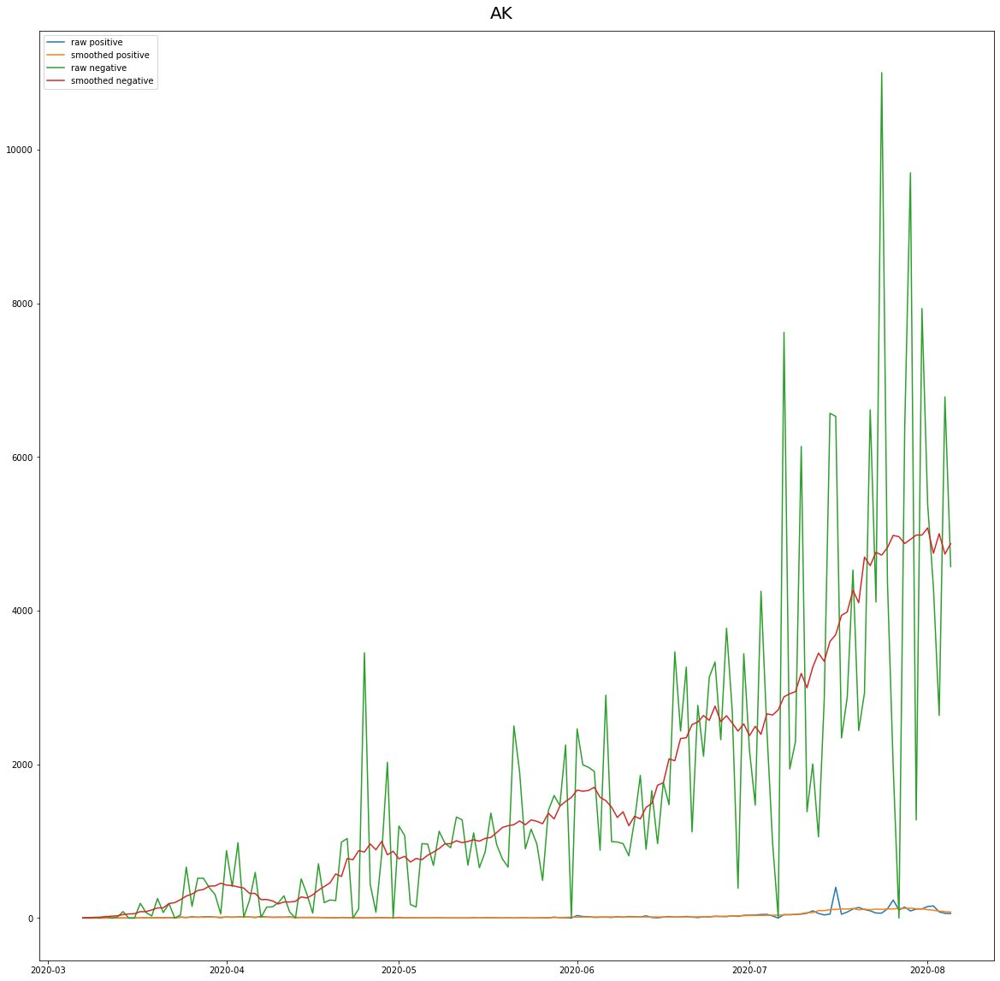

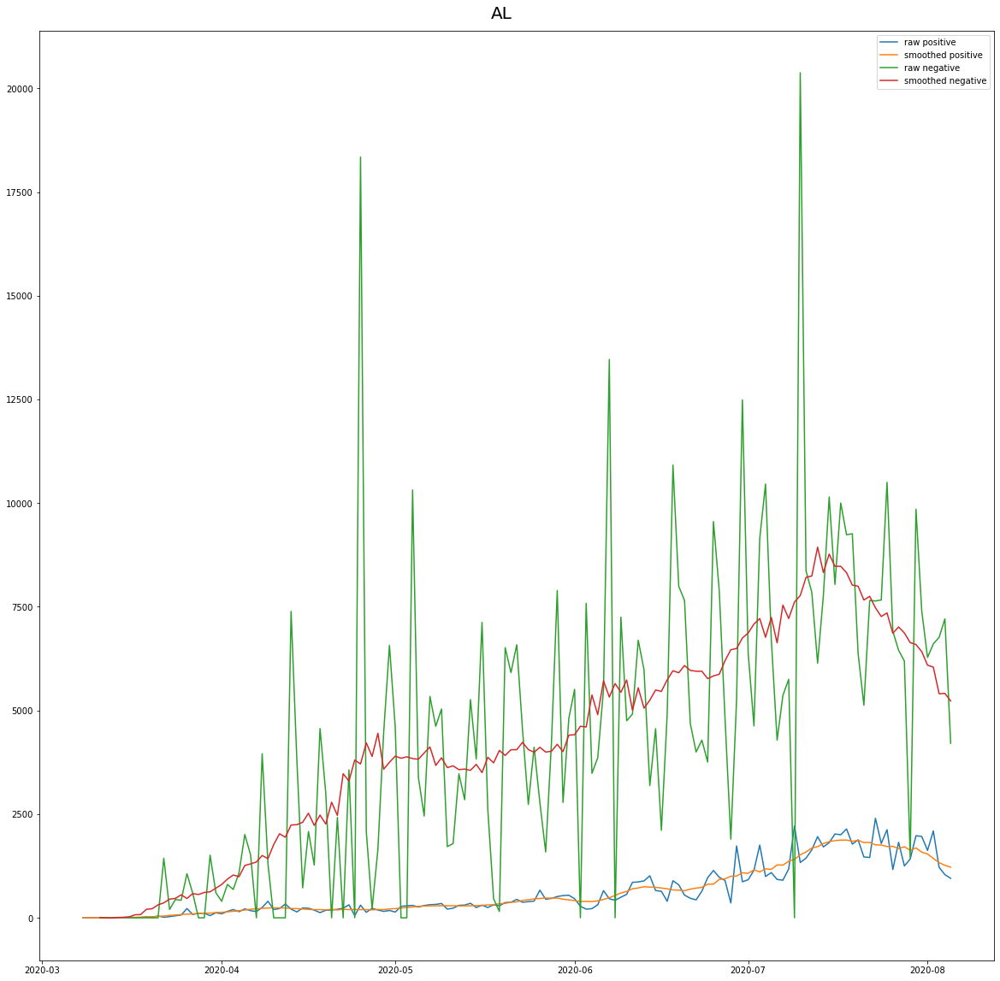

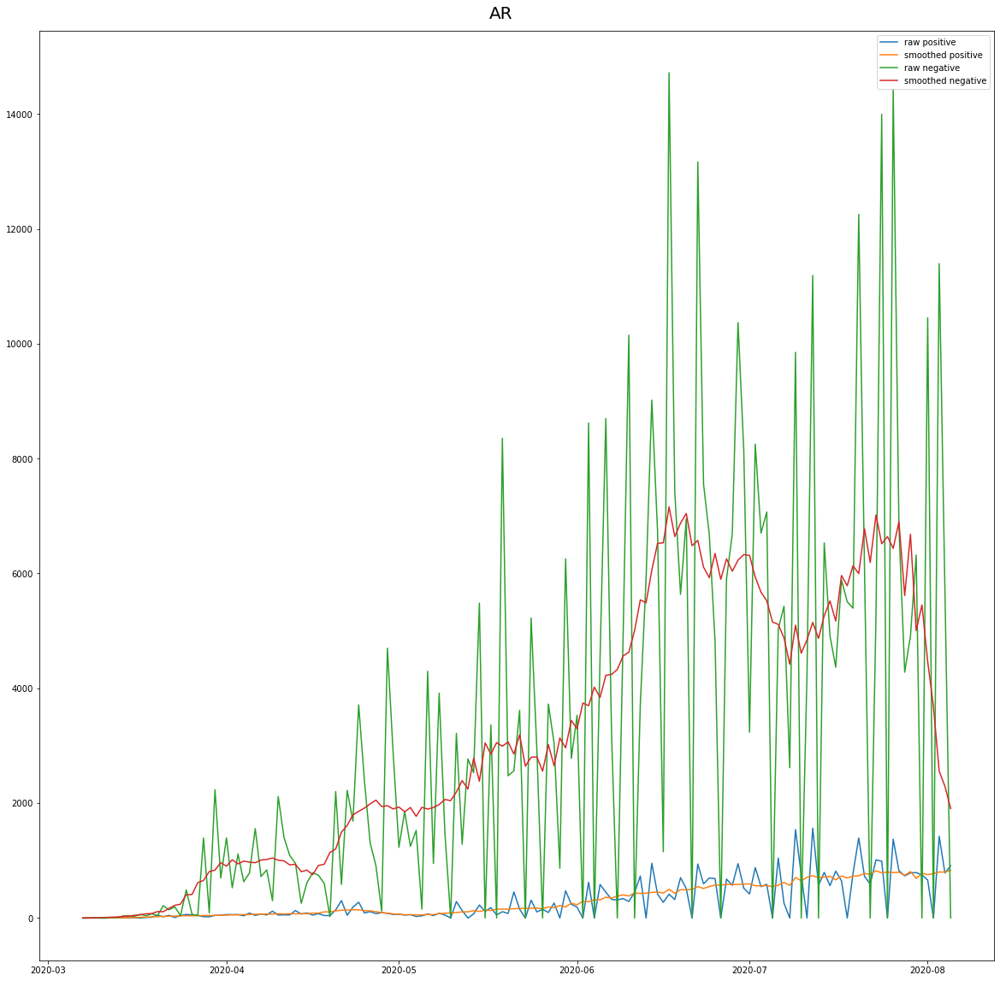

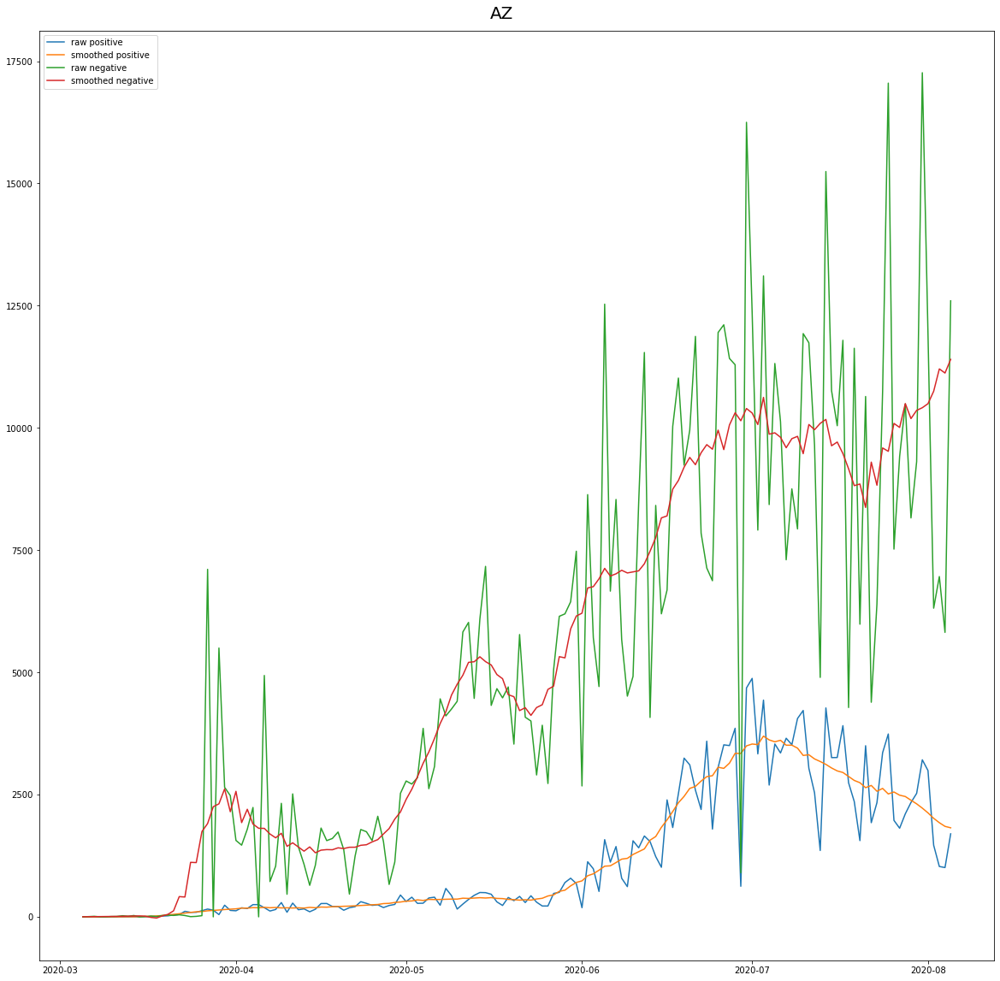

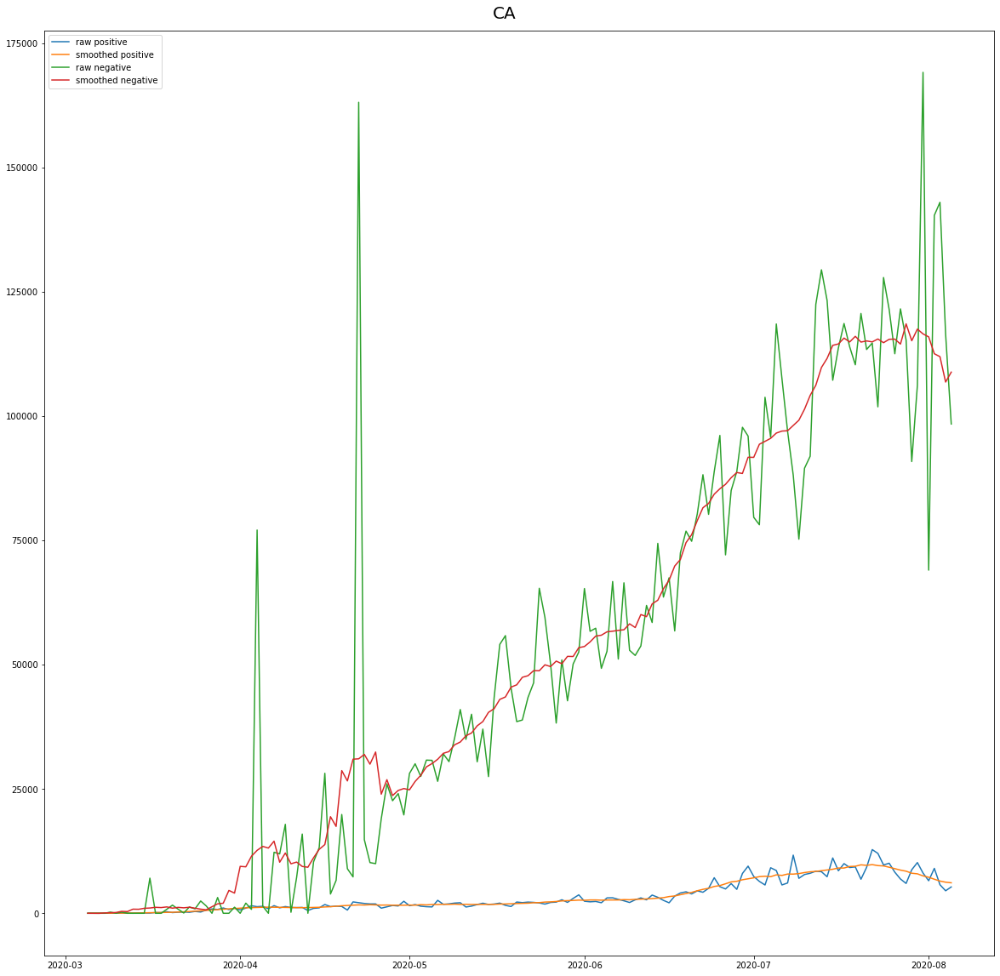

...

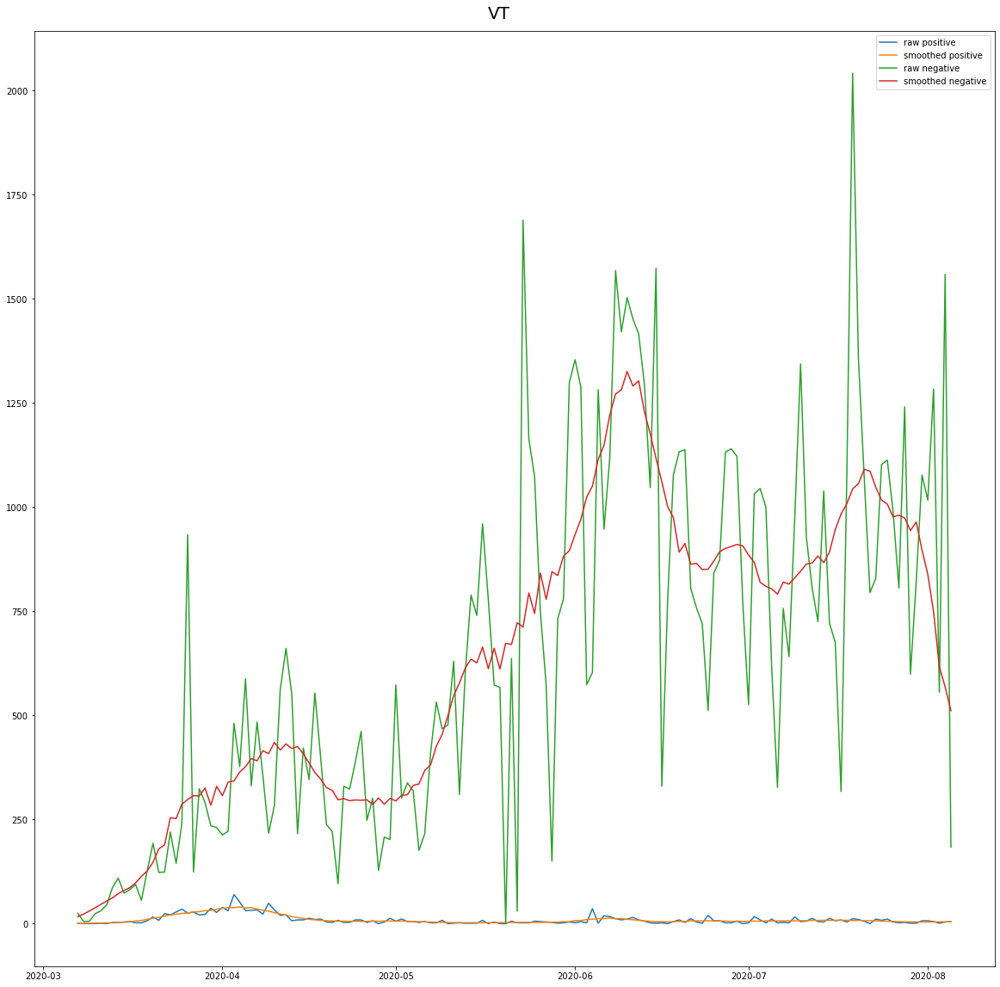

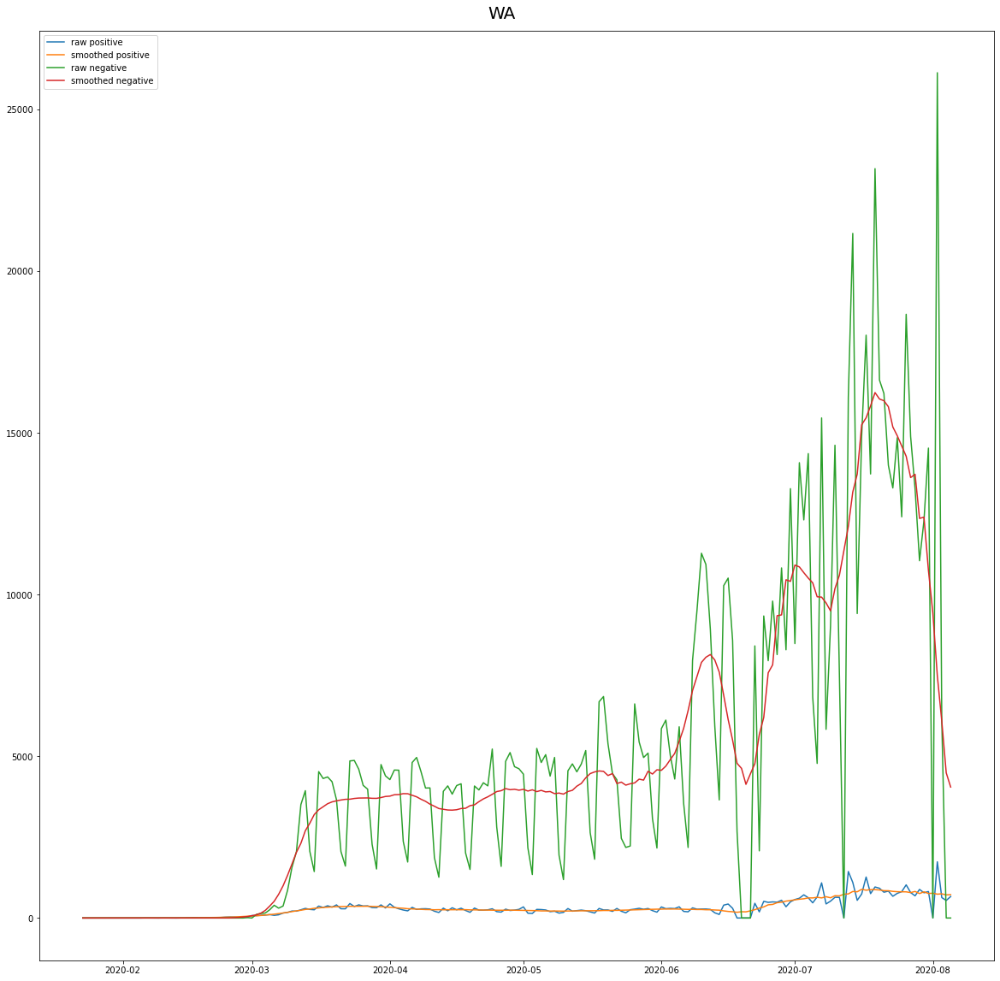

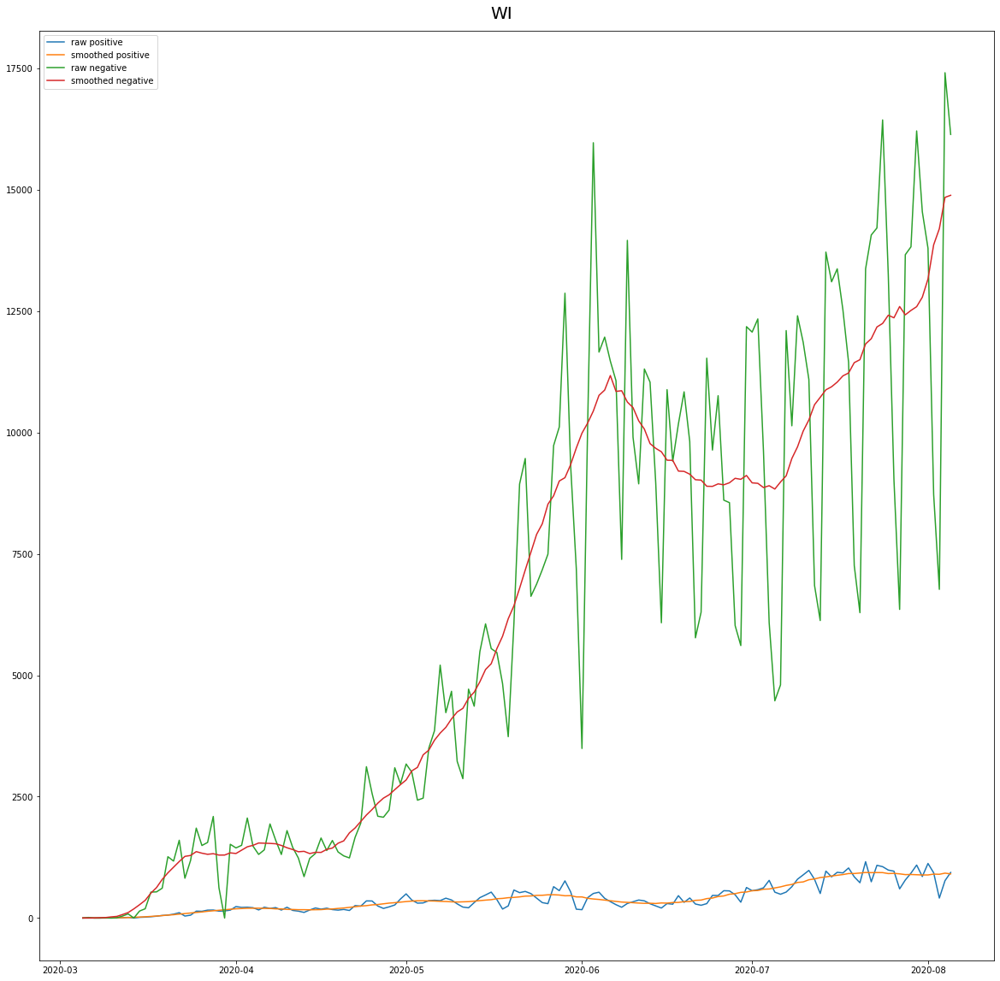

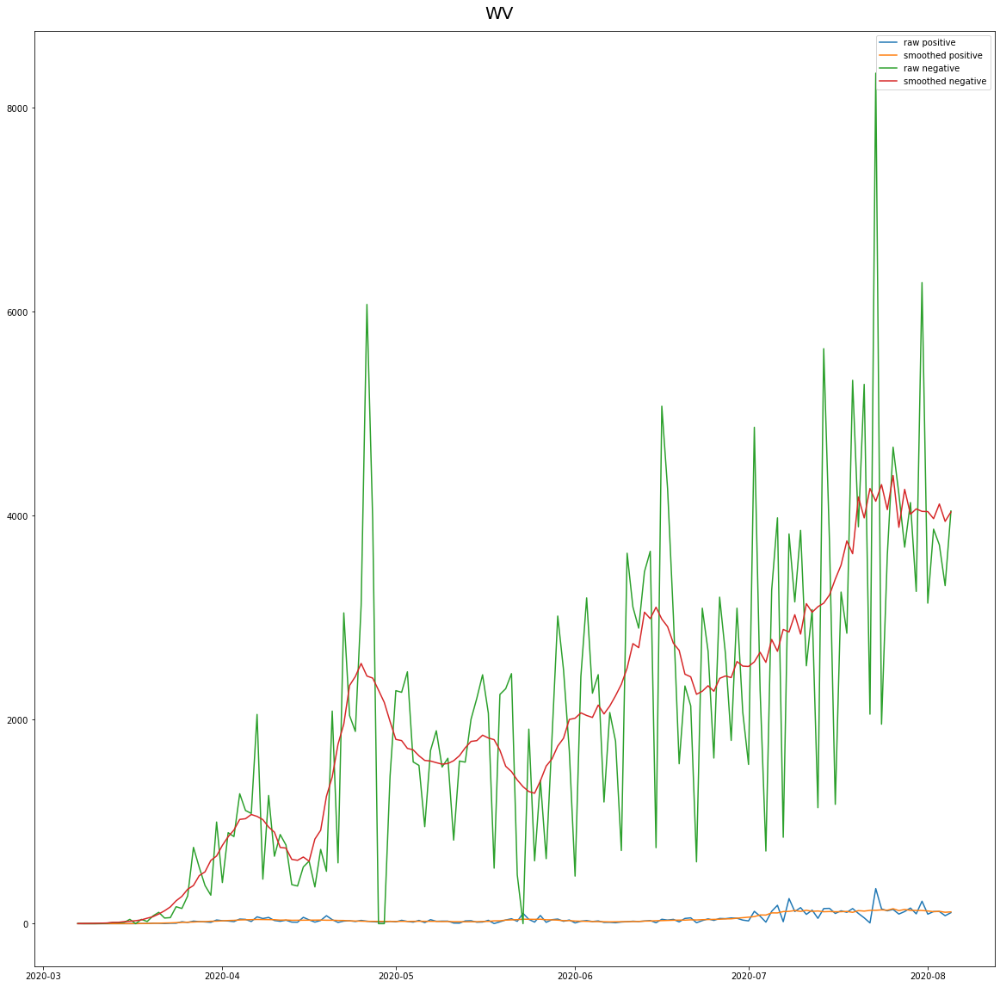

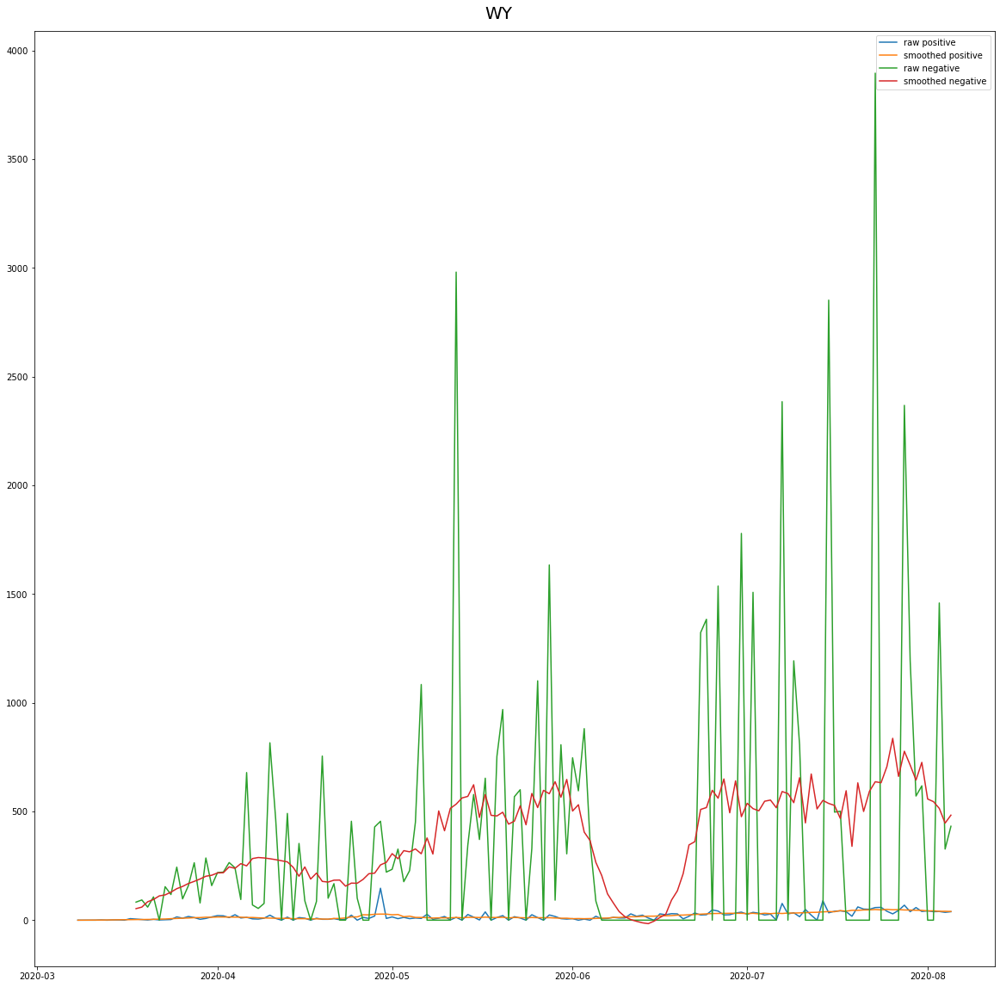

In [176]:
for state in df['state'].unique():
    
    statedf = df[df.state==state][['date','positive_diff','positive_diff_smooth','negative_diff','negative_diff_smooth']]    
    
    fig,ax = plt.subplots(1, 1, figsize=(20,20))
    ax = [ax]
        
    ax[0].plot(statedf.date, statedf['positive_diff'], label='raw positive')
    ax[0].plot(statedf.date, statedf['positive_diff_smooth'], label='smoothed positive')
    ax[0].plot(statedf.date, statedf['negative_diff'], label='raw negative')
    ax[0].plot(statedf.date, statedf['negative_diff_smooth'], label='smoothed negative')
    ax[0].legend()
    
    fig.suptitle(f"{state}", fontsize=20, y=0.9)

    plt.show()

## Structural Time Series

In [2]:
import time
import matplotlib.pyplot as plt
import numpy as np

import tensorflow.compat.v2 as tf
import tensorflow_probability as tfp

from tensorflow_probability import bijectors as tfb
from tensorflow_probability import distributions as tfd

tf.enable_v2_behavior()

### Generate Data

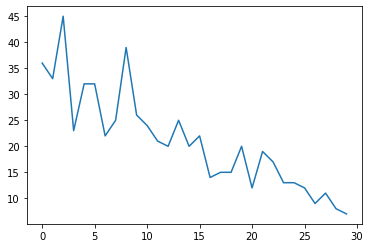

In [3]:
# Generate data
num_timesteps = 30
observed_counts = np.round( \
                           3 + np.random.lognormal( \
                                                   np.log(np.linspace(num_timesteps, 5, num=num_timesteps)), 
                                                   0.20, size=num_timesteps
                                                  ) \
                          ) 
observed_counts = observed_counts.astype(np.float32)
plt.plot(observed_counts)

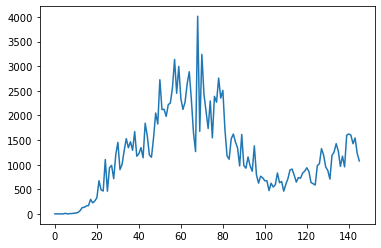

In [146]:
ildf = df[df['state'] == 'IL']['delta_positive']
ildf = ildf[ildf.notnull()]

# Generate data
num_timesteps = len(ildf)
observed_counts = np.array(ildf)
observed_counts = observed_counts.astype(np.float32)
plt.plot(observed_counts)

### Model Building

In [256]:
# Function for model:
# y(t) = LocalLinearTrend(t)
positive_bijector = tfb.Softplus()
def build_model(observed_counts):
    softplus_obs       = positive_bijector.inverse(observed_counts+1e-2)
    
    day_of_week_effect = tfp.sts.Seasonal(num_seasons=7, observed_time_series=softplus_obs, 
                                          name='day_of_week_effect')
    trend              = tfp.sts.Autoregressive(order=1,
                                                observed_time_series=softplus_obs,
                                                name='autoregressive')
    return tfp.sts.Sum([day_of_week_effect, trend], observed_time_series=observed_counts)

# Build model
sts_model = build_model(observed_counts)

### VI Model Fitting

In [257]:
surrogate_posterior = tfp.experimental.vi.build_factored_surrogate_posterior(
    event_shape=model.event_shape[:-1],  # Infer everything but the observed counts.
    constraining_bijectors=constraining_bijectors)

# Allow external control of optimization to reduce test runtimes.
num_variational_steps = 200 # @param { isTemplate: true}
num_variational_steps = int(num_variational_steps)

t0 = time.time()
losses = tfp.vi.fit_surrogate_posterior(target_log_prob_fn,
                                        surrogate_posterior,
                                        optimizer=tf.optimizers.Adam(0.1),
                                        num_steps=num_variational_steps)
t1 = time.time()
print("Inference ran in {:.2f}s.".format(t1-t0))

Inference ran in 45.06s.


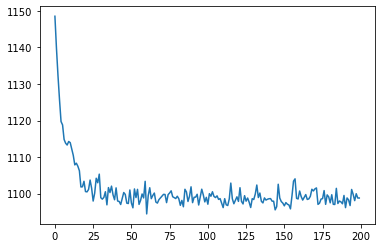

In [259]:
# Allow external control of optimization to reduce test runtimes.
num_variational_steps = 200 # @param { isTemplate: true}
num_variational_steps = int(num_variational_steps)

# Build the variational surrogate posteriors `qs`.
variational_posteriors = tfp.sts.build_factored_surrogate_posterior(model=sts_model)

# Using fit_surrogate_posterior to build and optimize the variational loss function.
optimizer = tf.optimizers.Adam(learning_rate=.1)
@tf.function(experimental_compile=True)
def train():
    elbo_loss_curve = tfp.vi.fit_surrogate_posterior(
        target_log_prob_fn = sts_model.joint_log_prob(
            observed_time_series = observed_counts),
        surrogate_posterior = variational_posteriors,
        optimizer = optimizer,
        num_steps = num_variational_steps)
    return elbo_loss_curve

elbo_loss_curve = train()

plt.plot(elbo_loss_curve)
plt.show()

# Draw samples from the variational posterior.
q_samples_sts_ = variational_posteriors.sample(100)

In [260]:
print("Inferred parameters:")
for param in sts_model.parameters:
    print("{}: {} +- {}".format(param.name,
                                np.mean(q_samples_sts_[param.name], axis=0),
                                np.std(q_samples_sts_[param.name], axis=0)))

Inferred parameters:
observation_noise_scale: 281.797119140625 +- 15.207074165344238
day_of_week_effect/_drift_scale: 3.5389292240142822 +- 3.0315988063812256
autoregressive/_coefficients: [0.9630922] +- [0.01129249]
autoregressive/_level_scale: 148.20645141601562 +- 17.664281845092773


### VI Model Forecasting

In [261]:
num_forecast_steps = 30
num_samples        = 100

# Get forecast distribution
sts_forecast_dist = tfp.sts.forecast(
    sts_model,
    observed_time_series=observed_counts,
    parameter_samples=q_samples_sts_,
    num_steps_forecast=num_forecast_steps)

sts_forecast_mean, sts_forecast_scale, sts_forecast_samples = (
    positive_bijector.forward(sts_forecast_dist.mean()).numpy()[..., 0],
    positive_bijector.forward(sts_forecast_dist.stddev()).numpy()[..., 0],
    positive_bijector.forward(sts_forecast_dist.sample(num_samples)).numpy()[..., 0])

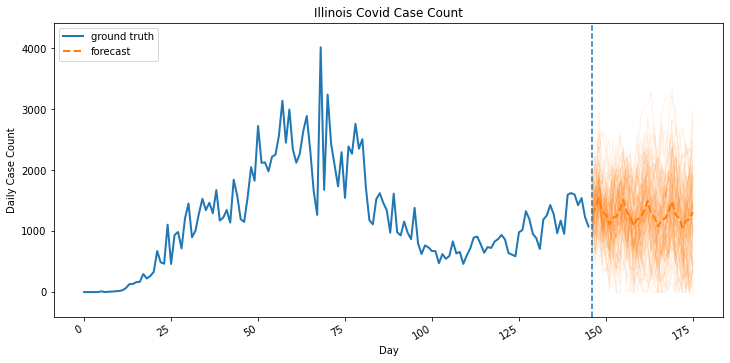

In [262]:
import seaborn as sns

colors = sns.color_palette()
c1, c2 = colors[0], colors[1]
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1, 1, 1)

num_steps = len(observed_counts)
num_steps_forecast = sts_forecast_mean.shape[-1]
num_steps_train = num_steps - num_steps_forecast

index = np.arange(num_steps+num_steps_forecast)

observed_steps = np.arange(num_steps,dtype=index.dtype)
forecast_steps = np.arange(num_steps,num_steps+num_steps_forecast,dtype=index.dtype)

ax.plot(observed_steps, observed_counts, lw=2, color=c1, label='ground truth')
ax.plot(forecast_steps, sts_forecast_samples.T, lw=1, color=c2, alpha=0.1)
ax.plot(forecast_steps, sts_forecast_mean, lw=2, ls='--', color=c2, label='forecast')
# ax.fill_between(forecast_steps,
#                 np.where(sts_forecast_mean-2*sts_forecast_scale < 0, 0, sts_forecast_mean-2*sts_forecast_scale),
#                 sts_forecast_mean+2*sts_forecast_scale, color=c2, alpha=0.2)

ymin = min(np.min(sts_forecast_samples), np.min(observed_counts))
ymax = max(np.max(sts_forecast_samples), np.max(observed_counts))
yrange = ymax-ymin
ax.set_ylim([ymin - yrange*0.1, ymax + yrange*0.1])
ax.set_title("Illinois Covid Case Count")
ax.legend()

ax.axvline(index[-num_forecast_steps], linestyle="--")
ax.legend(loc="upper left")
ax.set_ylabel("Daily Case Count")
ax.set_xlabel("Day")
fig.autofmt_xdate()

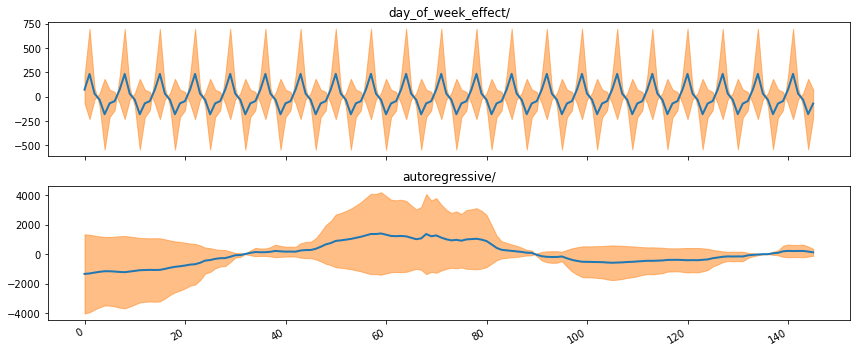

In [263]:
import collections

component_dists = tfp.sts.decompose_by_component(
    sts_model,
    observed_time_series=observed_counts,
    parameter_samples=q_samples_sts_)

sts_component_means_, sts_component_stddevs_ = (
    {k.name: c.mean() for k, c in component_dists.items()},
    {k.name: c.stddev() for k, c in component_dists.items()})


axes_dict = collections.OrderedDict()
num_components = len(sts_component_means_)

colors = sns.color_palette()
c1, c2 = colors[0], colors[1]

fig = plt.figure(figsize=(12, 2.5 * num_components))
for i, component_name in enumerate(sts_component_means_.keys()):
    component_mean = sts_component_means_[component_name]
    component_stddev = sts_component_means_[component_name]

    ax = fig.add_subplot(num_components,1,1+i)
    ax.plot(observed_steps, component_mean, lw=2)
    ax.fill_between(observed_steps,
                    component_mean-2*component_stddev,
                    component_mean+2*component_stddev,
                    color=c2, alpha=0.5)
    ax.set_title(component_name)
    axes_dict[component_name] = ax

fig.autofmt_xdate()
fig.tight_layout()

### HMC Model Fitting

array([28., 30., 28., 26., 32., 34., 41., 26., 20., 31., 31., 24., 21.,
       32., 23., 20., 17., 19., 17., 16., 15., 17., 11., 12., 12., 11.,
       11., 10.,  9.,  7.], dtype=float32)

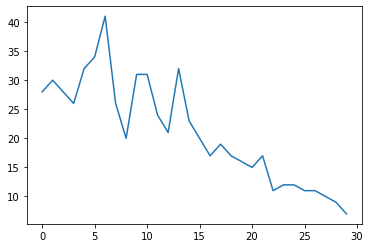

In [460]:
num_timesteps = 30
observed_counts = np.round(3 + np.random.lognormal(np.log(np.linspace(
    num_timesteps, 5, num=num_timesteps)), 0.20, size=num_timesteps)) 
observed_counts = observed_counts.astype(np.float32)
plt.plot(observed_counts)
observed_counts

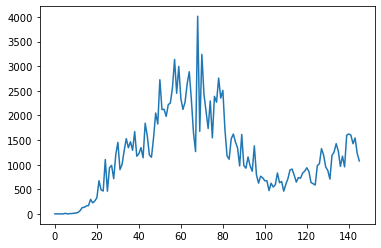

In [793]:
ildf = df[df['state'] == 'IL']['delta_positive']
ildf = ildf[ildf.notnull()]
ildf = ildf.iloc[-150:]

# Generate data
num_timesteps = len(ildf)
observed_counts = np.round(np.array(ildf))
observed_counts = observed_counts.astype(np.float32)
plt.plot(observed_counts)

In [794]:
num_timesteps = len(observed_counts)
scalar = np.max(observed_counts)/5.0

def build_model(approximate_unconstrained_rates):
    trend              = tfp.sts.LocalLinearTrend(observed_time_series=approximate_unconstrained_rates, name='trend')
    day_of_week_effect = tfp.sts.Seasonal(num_seasons=7, observed_time_series=approximate_unconstrained_rates, 
                                          name='day_of_week_effect')
    return tfp.sts.Sum([trend, day_of_week_effect], observed_time_series=approximate_unconstrained_rates)

positive_bijector = tfb.Softplus()  # Or tfb.Exp()

# Approximate the unconstrained Poisson rate just to set heuristic priors.
# We could avoid this by passing explicit priors on all model params.
approximate_unconstrained_rates = positive_bijector.inverse(tf.convert_to_tensor(observed_counts) + 0.01)
sts_model = build_model(approximate_unconstrained_rates)

Root = tfd.JointDistributionCoroutine.Root
def sts_with_poisson_likelihood_model():
    # Encode the parameters of the STS model as random variables.
    param_vals = []
    for param in sts_model.parameters:
        param_val = yield Root(param.prior)
        param_vals.append(param_val)

    # Use the STS model to encode the log- (or inverse-softplus)
    # rate of a Poisson.
    unconstrained_rate = yield sts_model.make_state_space_model(num_timesteps, param_vals)
    rate = positive_bijector.forward(unconstrained_rate[..., 0])
    
    r    = tf.constant(5.)
    prob = rate/(rate+r)
    observed_counts = yield tfd.Independent(tfd.NegativeBinomial(r, probs=prob), reinterpreted_batch_ndims=1)
    
model = tfd.JointDistributionCoroutine(sts_with_poisson_likelihood_model)

# Condition a joint log-prob on the observed counts.
target_log_prob_fn = lambda *args: model.log_prob(args + (observed_counts,))

# `unconstrained_rate` is already unconstrained, but
# we can speed up inference by rescaling it.
constraining_bijectors = ([param.bijector for param in sts_model.parameters] +
                          [tfb.Scale(positive_bijector.inverse(np.float32(np.max(observed_counts / scalar))))])

In [795]:
# Allow external control of sampling to reduce test runtimes.
num_results      = int(1000) # @param { isTemplate: true}
num_burnin_steps = int(100)  # @param { isTemplate: true}

sampler = tfp.mcmc.TransformedTransitionKernel(
            tfp.mcmc.NoUTurnSampler(
                target_log_prob_fn = target_log_prob_fn,
                step_size          = 0.1
            ),
            bijector=constraining_bijectors
          )

adaptive_sampler = tfp.mcmc.DualAveragingStepSizeAdaptation(
                    inner_kernel         = sampler,
                    num_adaptation_steps = int(0.8 * num_burnin_steps),
                    target_accept_prob   = 0.75,
                    # NUTS inside of a TTK requires custom getter/setter functions.
                    step_size_setter_fn  = lambda pkr, new_step_size: pkr._replace(
                                               inner_results = pkr.inner_results._replace(step_size = new_step_size)
                                               ),
                    step_size_getter_fn  = lambda pkr: pkr.inner_results.step_size,
                    log_accept_prob_getter_fn = lambda pkr: pkr.inner_results.log_accept_ratio,
                    )

initial_state = [b.forward(tf.random.normal(part_shape)) 
                 for (b, part_shape) in zip(constraining_bijectors, model.event_shape[:-1])]

In [796]:
# Speed up sampling by tracing with `tf.function`.
@tf.function(autograph=False, experimental_compile=True)
def do_sampling():
    return tfp.mcmc.sample_chain(
              kernel=adaptive_sampler,
              current_state=initial_state,
              num_results=num_results,
              num_burnin_steps=num_burnin_steps)

t0 = time.time()
samples, kernel_results = do_sampling()
t1 = time.time()
print("Inference ran in {:.2f}s.".format(t1-t0))

C:\Users\steve\anaconda3\envs\pymc3env\lib\site-packages\tensorflow_probability\python\mcmc\sample.py:338: UserWarning: Tracing all kernel results by default is deprecated. Set the `trace_fn` argument to None (the future default value) or an explicit callback that traces the values you are interested in.
  warnings.warn('Tracing all kernel results by default is deprecated. Set '


Inference ran in 2624.77s.


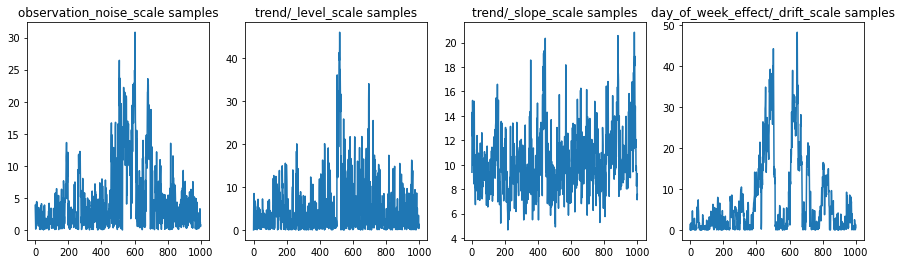

In [797]:
f = plt.figure(figsize=(15, 4))
for i, param in enumerate(sts_model.parameters):
    ax = f.add_subplot(1, len(sts_model.parameters), i + 1)
    ax.plot(samples[i])
    ax.set_title("{} samples".format(param.name))

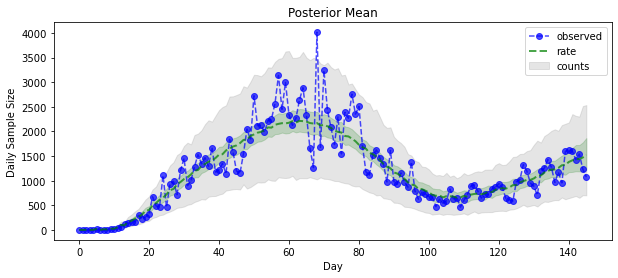

In [798]:
param_samples              = samples[:-1]
unconstrained_rate_samples = samples[-1][..., 0]
rate_samples               = positive_bijector.forward(unconstrained_rate_samples)

plt.figure(figsize=(10, 4))

# Get confidence intervals for rate and counts
mean_lower, mean_upper = np.percentile(rate_samples, [10, 90], axis=0)
pred_lower, pred_upper = np.percentile(np.random.negative_binomial(5., 1-rate_samples/(rate_samples+5.)), [10, 90], axis=0)

# Plot observed counts and negative binomial mean 
plt.plot(observed_counts,               label='observed', color="blue",  ls='--',     marker='o' , alpha=0.7)
plt.plot(np.mean(rate_samples, axis=0), label='rate',     color="green", ls='dashed', lw=2,        alpha=0.7)
plt.fill_between(np.arange(0, num_timesteps), mean_lower, mean_upper, color='green', alpha=0.2)
plt.fill_between(np.arange(0, num_timesteps), pred_lower, pred_upper, color='grey',  alpha=0.2, label='counts')
plt.xlabel("Day")
plt.ylabel("Daily Sample Size")
plt.title("Posterior Mean")
plt.legend()
plt.show()

In [799]:
def sample_forecasted_counts(sts_model, posterior_latent_rates,
                             posterior_params, num_steps_forecast,
                             num_sampled_forecasts):

    # Forecast the future latent unconstrained rates, given the inferred latent
    # unconstrained rates and parameters.
    unconstrained_rates_forecast_dist = tfp.sts.forecast(sts_model,
        observed_time_series=unconstrained_rate_samples,
        parameter_samples=posterior_params,
        num_steps_forecast=num_steps_forecast)

    # Transform the forecast to positive-valued Poisson rates.
    rates_forecast_dist = tfd.TransformedDistribution(
        unconstrained_rates_forecast_dist,
        positive_bijector)

    # Sample from the forecast model following the chain rule:
    # P(counts) = P(counts | latent_rates)P(latent_rates)
    sampled_latent_rates    = rates_forecast_dist.sample(num_sampled_forecasts)
    r    = tf.constant(5.)
    prob = sampled_latent_rates/(sampled_latent_rates+r)
    sampled_forecast_counts = tfd.NegativeBinomial(r, probs=prob).sample()

    return sampled_forecast_counts, sampled_latent_rates

forecast_samples, rate_samples = sample_forecasted_counts(
   sts_model,
   posterior_latent_rates=unconstrained_rate_samples,
   posterior_params=param_samples,
   # Days to forecast:
   num_steps_forecast=30,
   num_sampled_forecasts=100)

forecast_samples = np.squeeze(forecast_samples)

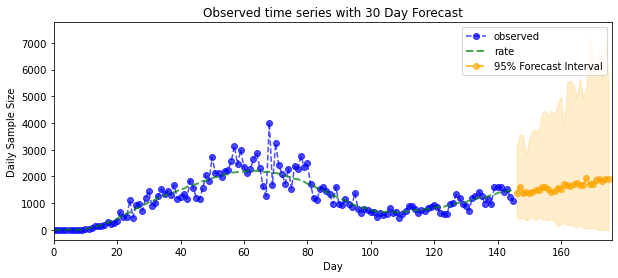

In [808]:
CI = 95

param_samples              = samples[:-1]
unconstrained_rate_samples = samples[-1][..., 0]
rate_samples               = positive_bijector.forward(unconstrained_rate_samples)

plt.figure(figsize=(10, 4))
forecast_median = np.median(forecast_samples, axis=0)

num_steps = len(observed_counts)
num_steps_forecast = forecast_median.shape[-1]

plt.plot(observed_counts,               label='observed', color="blue",  ls='--',     marker='o' , alpha=0.7)
plt.plot(np.mean(rate_samples, axis=0), label='rate',     color="green", ls='dashed', lw=2,        alpha=0.7)


forecast_steps = np.arange(num_steps, num_steps+num_steps_forecast)

CI_interval = [(100 - CI)/2, 100 - (100 - CI)/2]

plt.plot(forecast_steps, forecast_median, lw=2, ls='--', marker='o', color='orange',
         label=str(CI) + '% Forecast Interval', alpha=0.7)
lower, upper = np.percentile(forecast_samples, CI_interval, axis=0)
plt.fill_between(forecast_steps, lower, upper, color='orange', alpha=0.2)

plt.xlim([0, num_steps+num_steps_forecast])
ymin, ymax = min(np.min(forecast_samples), np.min(observed_counts)), max(np.max(forecast_samples), np.max(observed_counts))
yrange = ymax-ymin
plt.title("{}".format('Observed time series with ' + str(num_steps_forecast) + ' Day Forecast'))
plt.xlabel('Day')
plt.ylabel('Daily Sample Size')
plt.legend()

### Gaussian Process Regression

In [284]:
tfb = tfp.bijectors
tfd = tfp.distributions
tfk = tfp.math.psd_kernels

obs_index_points = np.arange(num_steps).astype('float64')[:,None]

def build_gp(amplitude, length_scale, observation_noise_variance):
    """Defines the conditional dist. of GP outputs, given kernel parameters."""

    # Create the covariance kernel, which will be shared between the prior (which we
    # use for maximum likelihood training) and the posterior (which we use for
    # posterior predictive sampling)
    kernel = tfk.ExponentiatedQuadratic(amplitude, length_scale)

    # Create the GP prior distribution, which we will use to train the model
    # parameters.
    return tfd.GaussianProcess(
      kernel=kernel,
      index_points=obs_index_points,
      observation_noise_variance=observation_noise_variance)

gp_joint_model = tfd.JointDistributionNamed({
    'amplitude': tfd.LogNormal(loc=0., scale=np.float64(1.)),
    'length_scale': tfd.LogNormal(loc=0., scale=np.float64(1.)),
    'observation_noise_variance': tfd.LogNormal(loc=0., scale=np.float64(1.)),
    'observations': build_gp,
})

In [286]:
# Create the trainable model parameters, which we'll subsequently optimize.
# Note that we constrain them to be strictly positive.

constrain_positive = tfb.Shift(np.finfo(np.float64).tiny)(tfb.Exp())

amplitude_var = tfp.util.TransformedVariable(
    initial_value=1.,
    bijector=constrain_positive,
    name='amplitude',
    dtype=np.float64)

length_scale_var = tfp.util.TransformedVariable(
    initial_value=1.,
    bijector=constrain_positive,
    name='length_scale',
    dtype=np.float64)

observation_noise_variance_var = tfp.util.TransformedVariable(
    initial_value=1.,
    bijector=constrain_positive,
    name='observation_noise_variance_var',
    dtype=np.float64)

trainable_variables = [v.trainable_variables[0] for v in [amplitude_var, length_scale_var, observation_noise_variance_var]]

In [293]:
# Now we optimize the model parameters.
num_iters = 1000
optimizer = tf.optimizers.Adam(learning_rate=.01)

# Use `tf.function` to trace the loss for more efficient evaluation.
@tf.function(autograph=False, experimental_compile=False)
def target_log_prob(amplitude, length_scale, observation_noise_variance):
    return gp_joint_model.log_prob({
      'amplitude': amplitude,
      'length_scale': length_scale,
      'observation_noise_variance': observation_noise_variance,
      'observations': observed_counts
    })

Trained parameters:
amplitude: 7.09835795351895
length_scale: 4.630135508872117
observation_noise_variance: 21.46331671258676


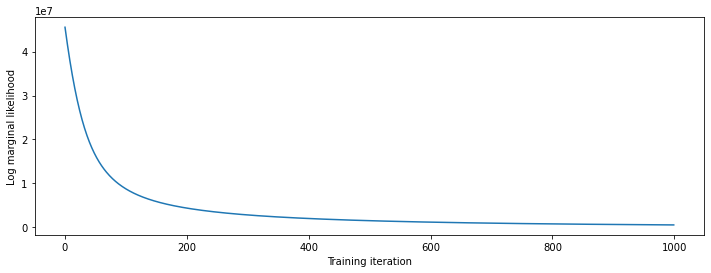

In [294]:
# Store the likelihood values during training, so we can plot the progress
lls_ = np.zeros(num_iters, np.float64)
for i in range(num_iters):
    with tf.GradientTape() as tape:
        loss = -target_log_prob(amplitude_var, length_scale_var,
                                observation_noise_variance_var)
        grads = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(grads, trainable_variables))
        lls_[i] = loss

print('Trained parameters:')
print('amplitude: {}'.format(amplitude_var._value().numpy()))
print('length_scale: {}'.format(length_scale_var._value().numpy()))
print('observation_noise_variance: {}'.format(observation_noise_variance_var._value().numpy()))

# Plot the loss evolution
plt.figure(figsize=(12, 4))
plt.plot(lls_)
plt.xlabel("Training iteration")
plt.ylabel("Log marginal likelihood")
plt.show()

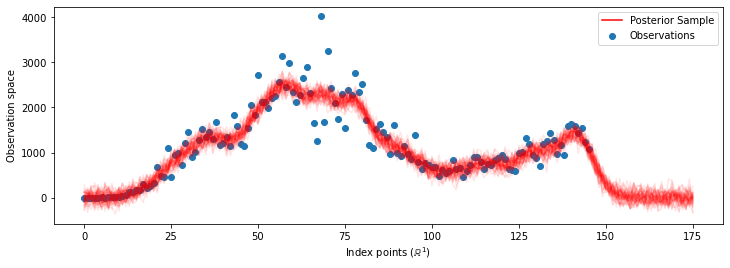

In [323]:
# Having trained the model, we'd like to sample from the posterior conditioned
# on observations. We'd like the samples to be at points other than the training
# inputs.
predictive_index_points_ = np.arange(num_steps+num_steps_forecast)[:,None].astype('float64')

optimized_kernel = tfk.ExponentiatedQuadratic(amplitude_var, length_scale_var)
gprm = tfd.GaussianProcessRegressionModel(
        kernel=optimized_kernel,
        index_points=predictive_index_points_,
        observation_index_points=obs_index_points,
        observations=observed_counts.astype('float64'),
        observation_noise_variance=observation_noise_variance_var,
        predictive_noise_variance=15000)

# Create op to draw  50 independent samples, each of which is a *joint* draw
# from the posterior at the predictive_index_points_. Since we have 200 input
# locations as defined above, this posterior distribution over corresponding
# function values is a 200-dimensional multivariate Gaussian distribution!
num_samples = 50
samples = gprm.sample(num_samples)

# Plot the true function, observations, and posterior samples.
plt.figure(figsize=(12, 4))
plt.scatter(obs_index_points[:, 0], observed_counts,
            label='Observations')
for i in range(num_samples):
    plt.plot(predictive_index_points_, samples[i, :], c='r', alpha=.1,
             label='Posterior Sample' if i == 0 else None)
leg = plt.legend(loc='upper right')
for lh in leg.legendHandles: 
    lh.set_alpha(1)
plt.xlabel(r"Index points ($\mathbb{R}^1$)")
plt.ylabel("Observation space")
plt.show()

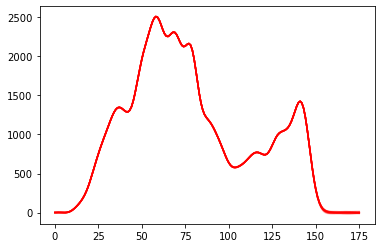

In [319]:
for i in range(num_samples):
    plt.plot(predictive_index_points_, samples[i, :], c='r', alpha=.1,
             label='Posterior Sample' if i == 0 else None)

## Seasonal Adjustment

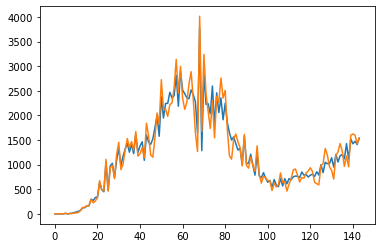

In [123]:
from scipy.signal import convolve, filtfilt, iirnotch

ildf = df[df['state'] == 'IL']['delta_positive'].dropna().reset_index(drop=True)
f0, Q, fs = 1/7, 1, 1
b, a = iirnotch(f0, Q, fs)

notched = filtfilt(b, a, ildf)
plt.plot(notched)
plt.plot(ildf)

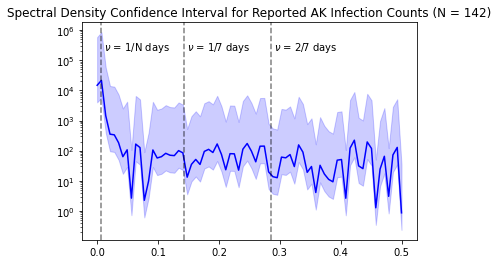

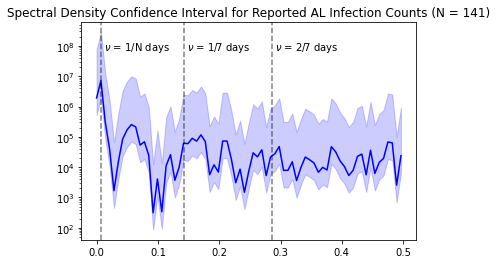

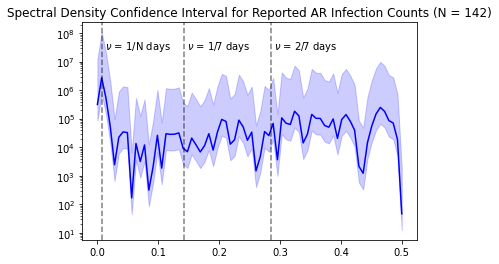

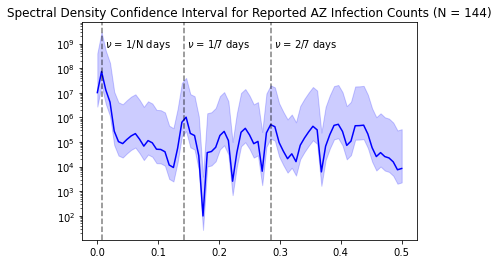

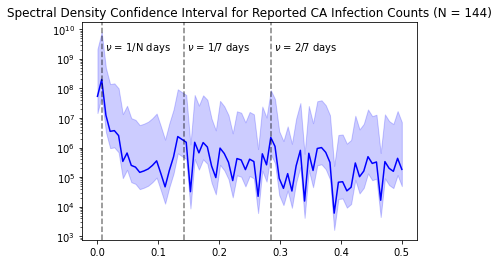

...

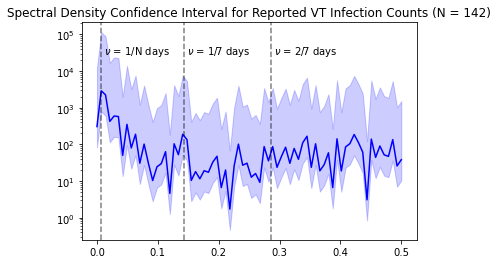

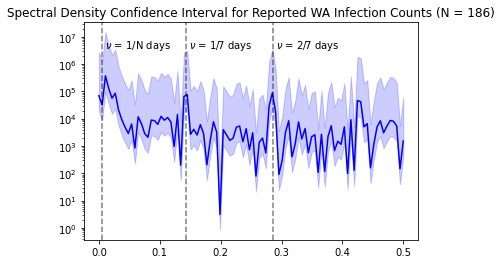

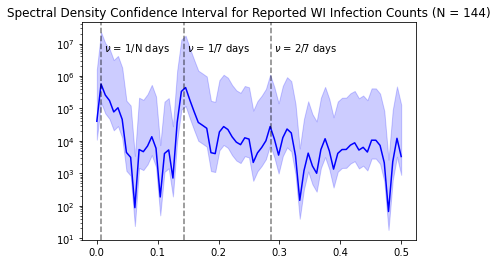

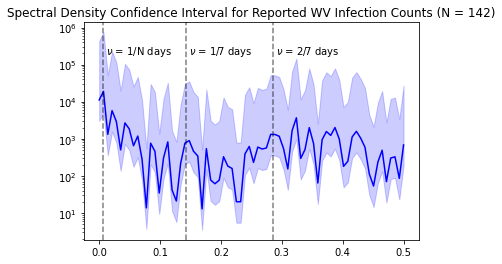

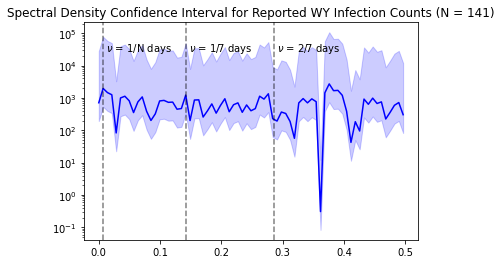

In [119]:
from scipy.fft import fft, ifft
from scipy.signal import blackman, periodogram, spectrogram, stft, welch, iirnotch, freqz, convolve, filtfilt
from scipy.stats import chi2
from tqdm import tqdm

for state in df['state'].unique():
    y = df[df['state'] == state]['delta_positive'].dropna().reset_index(drop=True)

    N = len(y)
    yf = fft(np.array(y))
    w = blackman(N)
    ywf = fft(np.array(y)*w)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

    # plt.plot(xf[1:N//2], 2/N * np.abs(ywf[1:N//2]), ".", alpha = 0.7, label='IL Death')
    # plt.xlabel(r"$\nu$")
    # plt.ylabel(r"$|\mathcal{F}(\nu)|$")
    # plt.legend(loc="upper right", fontsize = "x-small")
    # plt.title(f"Spectral Density Estimates for Reported Infection Counts", loc="left")
    # plt.gcf().set_size_inches(11, 8)
    # plt.show()

    f, Pxx = welch(np.array(y), scaling="density", nperseg=N)
    CI_upper = 2*Pxx/chi2.ppf(0.975, df=2)
    CI_lower = 2*Pxx/chi2.ppf(0.025, df=2)

    plt.semilogy(f, Pxx, label = "spectrum coefficients", color="blue")
    plt.fill_between(f, CI_lower, CI_upper, alpha = 0.2, color="blue")
    plt.axvline(1/7,  ls='--', color="black", alpha = 0.5)
    plt.axvline(2/7,  ls='--', color="black", alpha = 0.5)
    plt.axvline(1/N, ls='--', color="black", alpha = 0.5)
    plt.text(1/7, max(Pxx)*10, r" $\nu$ = 1/7 days")
    plt.text(2/7, max(Pxx)*10, r" $\nu$ = 2/7 days")
    plt.text(1/N, max(Pxx)*10, r" $\nu$ = 1/N days")
    plt.title(f"Spectral Density Confidence Interval for Reported {state} Infection Counts (N = {N})")
    plt.show()

Text(0.0, 1.0, 'Average Change in Reported Infections by Day of Week NY Case Count')

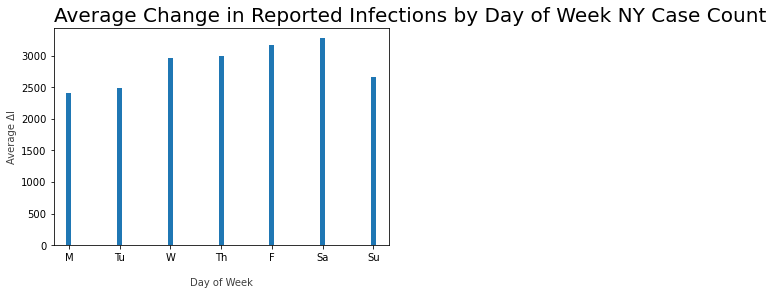

In [97]:
label      = "Illinois Case Count"

ildf = df[df['state'] == 'IL'][['date','delta_positive']].dropna().set_index('date')
ildf["dow"] = ildf.index.get_level_values(0).dayofweek

ildf.groupby("dow")["delta_positive"].agg(np.mean).reset_index().plot.bar(x = "dow", y = "delta_positive", width = 0.1) 
ax = plt.gca()
ax.get_legend().remove()
plt.xlabel("\nDay of Week")
plt.ylabel("Average ΔI")
ax.xaxis.label.set_alpha(0.75)
ax.yaxis.label.set_alpha(0.75)
xlabel_locs, _ = plt.xticks()
plt.xticks(xlabel_locs, ["M", "Tu", "W", "Th", "F", "Sa", "Su"], rotation = 0)
plt.title(f"Average Change in Reported Infections by Day of Week {label}", loc="left", fontdict=title_font)